## This will set up the CNN model and read in the 7 sets established in the image pre-processing steps

- Note: The output currently was only run for 2 epochs since this notebook is meant to be a comprehensive overview of the model and post-processing analysis

- Specific values of interest are output and stored as csv files in the same folder as sets1-7, including:
    - the predicted DFI values
    - the accuracy and loss values
    - a saved .keras model file with weights and model architecture
    
- The post-processing also produces scatterplots and histograms (as given in the final manuscript) to show the predicted versus measured DFI values and model performance

- Finally, saliency maps of certain cells are given to highlight regions of interest

## Imports

In [1]:
import matplotlib.pyplot as plt

# output inline plots as jpg
%matplotlib inline
%config InlineBackend.figure_format = 'jpg'
from matplotlib.image import imread

import PIL
import tensorflow as tf
import numpy as np
import os
import gc
from sklearn.metrics import confusion_matrix
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import itertools

# import all necessary tensorflow modules
from tensorflow.python.keras.models import Model, Sequential
from tensorflow.python.keras.layers import Dense, Activation, Flatten, Dropout, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.python.keras.layers import BatchNormalization
from tensorflow.python.keras.applications import VGG16
from tensorflow.python.keras.applications.vgg16 import preprocess_input, decode_predictions
from tensorflow.python.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.python.keras import regularizers

# from keras import backend as K
from tensorflow.python.keras import backend as K
from keras import callbacks, metrics, optimizers
from tensorflow.python.keras.models import load_model
from keras.applications.inception_v3 import InceptionV3
import keras

print(tf.__version__)

from tensorflow.python import keras as dummy_keras
print(dummy_keras.__version__)

from functools import partial
from itertools import product

import cv2

from PIL import Image
import datetime
now = datetime.datetime.now()
# create formatted date and time to save output to
todays_date = (now.strftime('%Y%m%d%H%M'))

import pandas as pd
# savgol filter smooths output accuracy to see clearer picture
from scipy.signal import savgol_filter
# set random seed so outputs shouldn't change that much run to run
np.random.seed(42)
tf.set_random_seed(42)

from sklearn.utils.class_weight import compute_class_weight
import time

Using TensorFlow backend.


1.8.0
2.1.5-tf


## Useful Tutorial Functions
from: https://github.com/Hvass-Labs/TensorFlow-Tutorials

In [2]:
def path_join(dirname, filenames):
    return [os.path.join(dirname, filename) for filename in filenames]

   
def load_images(image_paths):
    # Load the images from disk.
    images = [plt.imread(path) for path in image_paths]

    # Convert to a numpy array and return it.
    return np.asarray(images)

def print_layer_trainable():
    for layer in conv_model.layers:
        print("{0}:\t{1}".format(layer.trainable, layer.name))

## Saliency map operations

In [3]:
class GradientSaliency(object):

    def __init__(self, model, output_index=0):
        input_tensors = [model.input,        # placeholder for input image tensor
                         #K.learning_phase(), # placeholder for mode (train or test) tense
                        ]
        gradients = model.optimizer.get_gradients(model.output[:,output_index], model.input)
        self.compute_gradients = K.function(inputs=input_tensors, outputs=gradients)

    def get_mask(self, input_image):
        
        x_value = np.expand_dims(input_image, axis=0)
        gradients = self.compute_gradients([x_value])[0]

        return gradients
    
def saliency_visualization(data_generator, sample_size=5):
    image, labels = data_generator.next()
    
    plt.figure(figsize=(18, 10))
    reference = image[:sample_size]
    for i in range(reference.shape[0]):
        plt.subplot(int(reference.shape[0]/sample_size)+1, sample_size, i+1)
        plt.imshow(reference[i])
        plt.xticks([])
        plt.yticks([])
    plt.show()
    
    maps = []
    for i in range(sample_size):
        saliency = GradientSaliency(model, np.argmax(labels[i]))
        saliency_map = saliency.get_mask(image[i])
        saliency_map[saliency_map<0] = 0
        saliency_map = saliency_map / np.max(saliency_map)
        maps.append(saliency_map[0])
    saliency_maps = np.stack(maps)
    saliency_maps = np.max(saliency_maps, axis=3)
    plt.figure(figsize=(18, 10))
    reference = saliency_maps
    for i in range(reference.shape[0]):
        plt.subplot(int(reference.shape[0]/sample_size)+1, sample_size, i+1)
        plt.imshow(reference[i])
        plt.xticks([])
        plt.yticks([])
    plt.show()

## Specify Saved Names and Directory to Work in (where images are)

In [21]:
# create list of all folders to look at
# which folder is the data stored in?
data_dir0 = 'D:\CNN_testing\data'

allDirs = []

# set folder to store accuracies and predictions
# if you already ran this model, then set folder name to that of 
#    already-generated output
use_manual_date = False

if use_manual_date:
#     todays_date = 'VGG_201811141215_best'
    folder_name = todays_date
    
    just_read_saved = True # use already-generated model output?
else:
    just_read_saved = False # use already-generated model output?
    # dont change the following
    folder_name = 'VGG_' + todays_date
    


# create the directory
if not os.path.exists(os.path.join(data_dir0,folder_name)):
    os.makedirs(os.path.join(data_dir0,folder_name))
    
# find all shuffled sets and create list of all folders to run model on
for root, dirs, files in os.walk(data_dir0, topdown=True):    
    for dirName in dirs:
        temp_dir = os.path.join(root, dirName)
        
#         print(temp_dir.split('\\'))
        
        if len(temp_dir.split('\\'))==4 and 'set' in temp_dir.split('\\')[-1]:
            allDirs.append(temp_dir + '\\')
#             print(temp_dir.split('\\'))

# what to name model to save, model history log file, and predictions csv
# no need to change these
saved_model0 = 'saved_model.keras'
log_file0 = 'acc_loss_log_file.csv'
predictions_out0 = 'predictions_out.csv'

saved_model1 = np.array(len(allDirs) * [saved_model0])
log_file1 = np.array(len(allDirs) * [log_file0])
predictions_out1 = np.array(len(allDirs) * [predictions_out0])

better_allDirs0 = [my_string.replace('\\','_') for my_string in allDirs]
better_allDirs = [my_string.replace(data_dir0,data_dir0+folder_name+'/') 
                 for my_string in better_allDirs0]

saved_models = np.core.defchararray.add(better_allDirs,saved_model1)
log_files = np.core.defchararray.add(better_allDirs,log_file1)
predictions_outs = np.core.defchararray.add(better_allDirs,predictions_out1)
    
print('Check these folders... \n')
print(np.asarray(allDirs),'\n')
print(predictions_outs[0], '\n')
print(saved_models[0])

Check these folders... 

['D:\\CNN_testing\\data\\set1\\' 'D:\\CNN_testing\\data\\set2\\'
 'D:\\CNN_testing\\data\\set3\\' 'D:\\CNN_testing\\data\\set4\\'
 'D:\\CNN_testing\\data\\set5\\' 'D:\\CNN_testing\\data\\set6\\'
 'D:\\CNN_testing\\data\\set7\\'] 

D:_CNN_testing_data_set1_predictions_out.csv 

D:_CNN_testing_data_set1_saved_model.keras


## Create Model and Run

D:\CNN_testing\data\set1\train\class0
D:\CNN_testing\data\set1\test\class0
D:\CNN_testing\data\set1\final_test\class0
D:\CNN_testing\data\set1\train/ num 1 of 1
Found 445 images belonging to 1 classes.
Found 112 images belonging to 1 classes.
Found 507 images belonging to 1 classes.


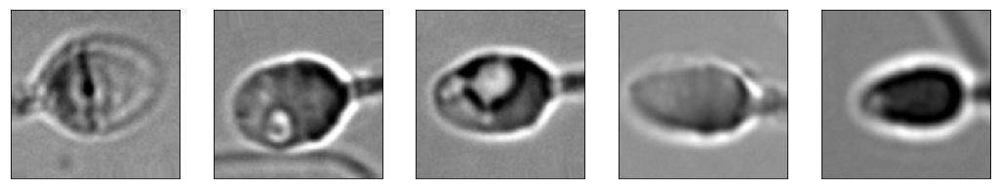

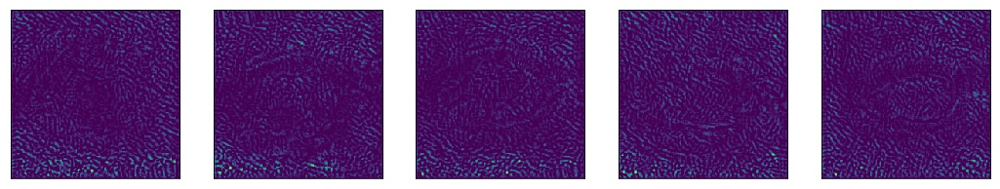

Found 445 images belonging to 1 classes.
16/15 [==============================] - 4s 260ms/step

 mae=1111.121, val_mae=1103.805
total time is 0.79 minutes
D:\CNN_testing\data\set2\train\class0
D:\CNN_testing\data\set2\test\class0
D:\CNN_testing\data\set2\final_test\class0
D:\CNN_testing\data\set2\train/ num 1 of 1
Found 731 images belonging to 1 classes.
Found 183 images belonging to 1 classes.
Found 150 images belonging to 1 classes.


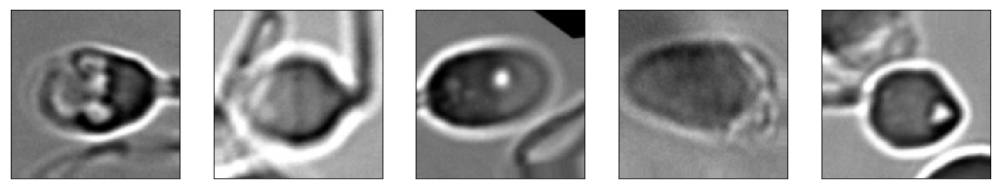

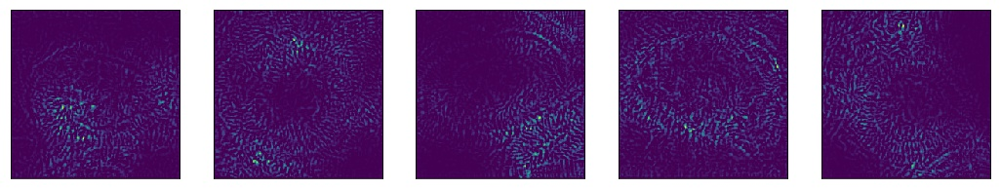

Found 731 images belonging to 1 classes.
5/4 [================================] - 2s 410ms/step

 mae=1072.848, val_mae=1035.464
total time is 0.81 minutes
D:\CNN_testing\data\set3\train\class0
D:\CNN_testing\data\set3\test\class0
D:\CNN_testing\data\set3\final_test\class0
D:\CNN_testing\data\set3\train/ num 1 of 1
Found 762 images belonging to 1 classes.
Found 191 images belonging to 1 classes.
Found 111 images belonging to 1 classes.


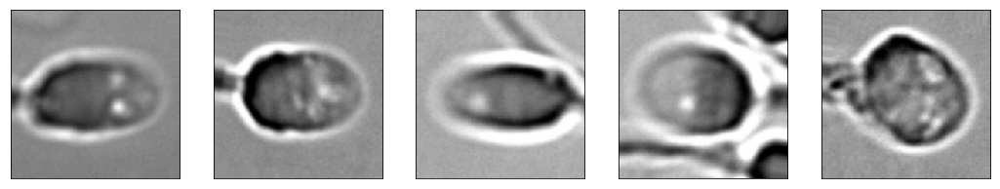

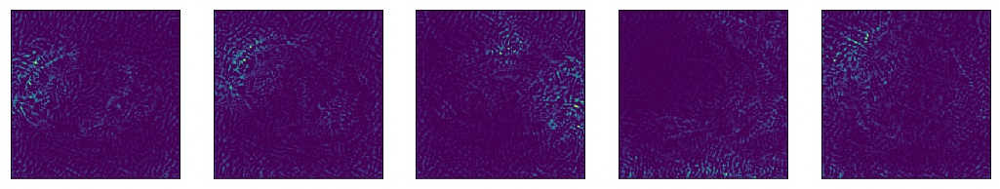

Found 762 images belonging to 1 classes.
4/3 [==================================] - 2s 385ms/step

 mae=1015.102, val_mae=1058.755
total time is 0.85 minutes
D:\CNN_testing\data\set4\train\class0
D:\CNN_testing\data\set4\test\class0
D:\CNN_testing\data\set4\final_test\class0
D:\CNN_testing\data\set4\train/ num 1 of 1
Found 780 images belonging to 1 classes.
Found 195 images belonging to 1 classes.
Found 89 images belonging to 1 classes.


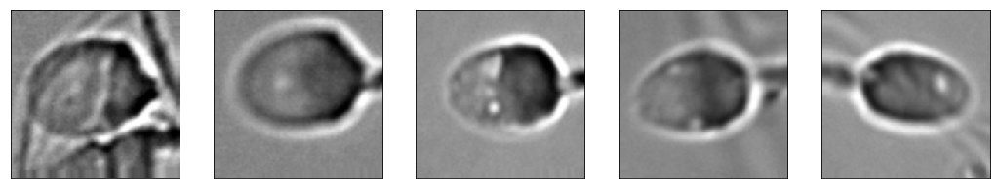

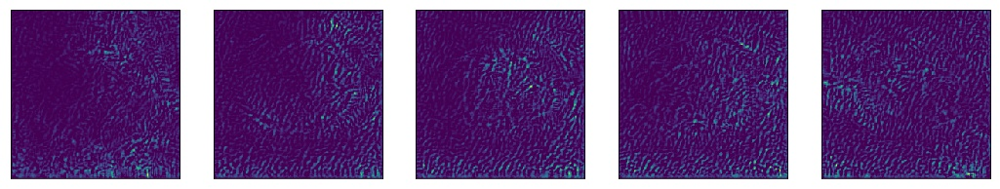

Found 780 images belonging to 1 classes.
3/2 [================================] - 2s 606ms/step

 mae=1028.787, val_mae=1030.455
total time is 0.83 minutes
D:\CNN_testing\data\set5\train\class0
D:\CNN_testing\data\set5\test\class0
D:\CNN_testing\data\set5\final_test\class0
D:\CNN_testing\data\set5\train/ num 1 of 1
Found 792 images belonging to 1 classes.
Found 199 images belonging to 1 classes.
Found 73 images belonging to 1 classes.


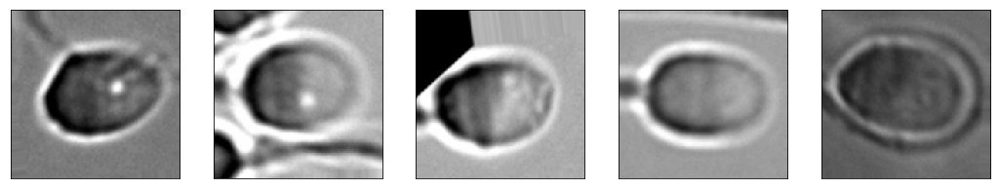

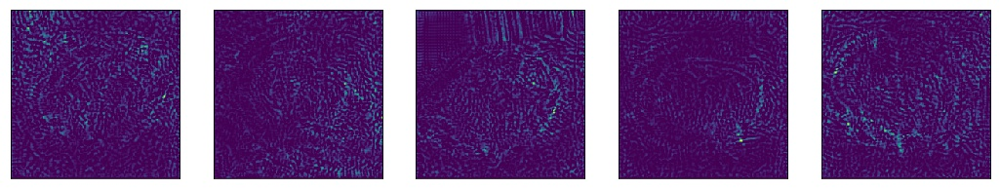

Found 792 images belonging to 1 classes.
3/2 [=======================================] - 1s 381ms/step

 mae=1024.771, val_mae=977.195
total time is 0.86 minutes
D:\CNN_testing\data\set6\train\class0
D:\CNN_testing\data\set6\test\class0
D:\CNN_testing\data\set6\final_test\class0
D:\CNN_testing\data\set6\train/ num 1 of 1
Found 744 images belonging to 1 classes.
Found 186 images belonging to 1 classes.
Found 134 images belonging to 1 classes.


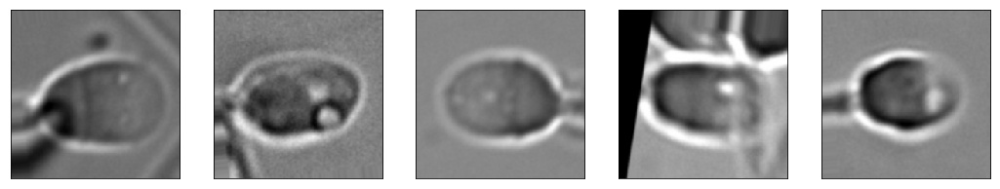

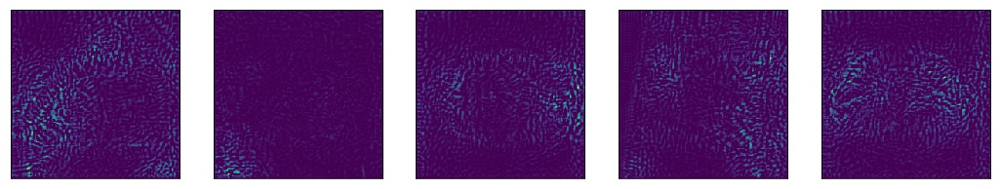

Found 744 images belonging to 1 classes.
5/4 [===================================] - 1s 278ms/step

 mae=1026.367, val_mae=993.966
total time is 0.79 minutes
D:\CNN_testing\data\set7\train\class0
D:\CNN_testing\data\set7\test\class0
D:\CNN_testing\data\set7\final_test\class0
D:\CNN_testing\data\set7\train/ num 1 of 1
Found 638 images belonging to 1 classes.
Found 213 images belonging to 1 classes.
Found 213 images belonging to 1 classes.


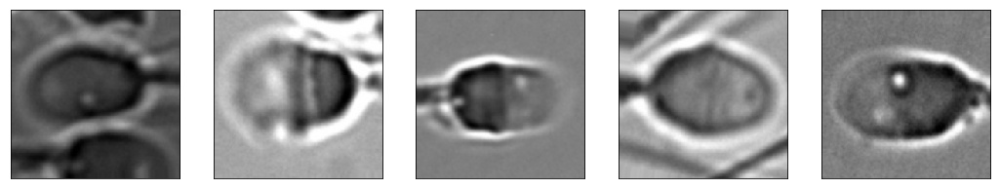

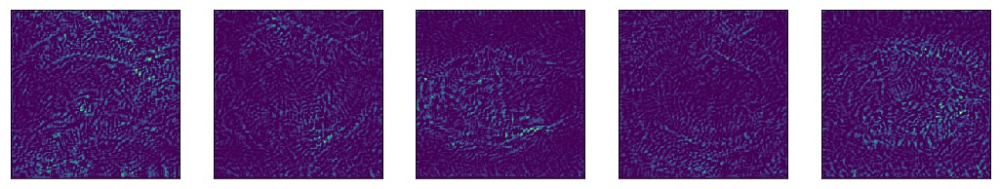

Found 638 images belonging to 1 classes.
7/6 [===============================] - 1s 190ms/step

 mae=1037.207, val_mae=1006.892
total time is 0.77 minutes


In [22]:
# clear session for memory concerns
K.clear_session()

## set these variables
VGG = True # either use VGG16 or custom convnet

# set activation functions
acts = ['elu']

# set loss type to minimize
# losses = [lambda y,f: pinball_loss(qs[ii],y,f) for ii in range(2)]
losses = ['mse']

n_times = len(losses) # how many runs to do of each set
                
# how to up/downscale images to VGG16 224x224, 'bilinear' works well
interpolation = 'bilinear' 

# do we want to output each line?
verbosity = 0 # 0 = no output, 1 = cute status bar, 2 = one line per epoch

mult_DFI = 1e4 # multiply DFI values by this so they're > 1

# run the model if we don't have saved output data yet
if not just_read_saved:
    
    # run for each Set, letter folder in /data/
    for i,data_dir in enumerate(allDirs):

        # set training data
        sub_data_dir = os.path.join(data_dir, 'train', 'class0')
        print(sub_data_dir)
        label_file = os.path.join(sub_data_dir, 'labels_train.csv')
        df = pd.read_csv(label_file)
        labels = np.asarray(df)[:,1].tolist()

        # set validation data
        sub_data_dir2 = os.path.join(data_dir, 'test', 'class0')
        print(sub_data_dir2)
        label_file2 = os.path.join(sub_data_dir2, 'labels_test.csv')
        df2 = pd.read_csv(label_file2)
        labels2 = np.asarray(df2)[:,1].tolist()
        
        # set validation data
        sub_data_dir2b = os.path.join(data_dir, 'final_test', 'class0')
        print(sub_data_dir2b)
        label_file2b = os.path.join(sub_data_dir2b, 'labels_final_test.csv')
        df2b = pd.read_csv(label_file2b)
        labels2b = np.asarray(df2b)[:,1].tolist()

        # grab output file names
        saved_model = saved_models[i]
        log_file = log_files[i]
        predictions_out = predictions_outs[i]

        ## run n_times for each set to see variability
        for ii in range(n_times):
             
            tic = time.time()

            act = acts[ii]
            loss = losses[ii]

            # set hyper-parameters
            dropout_rate=0.6 # 0.5 works well
            batch_size=32    # 12
            zoom_range=0.0 # how much to zoom in/out of original image
            rotation_range=10 # how much to rotate original image

            # create data generator for training that allows rotation/scaling
            datagen_train = ImageDataGenerator(
                rescale=1./255,
                rotation_range=rotation_range,
                zoom_range=zoom_range,
                vertical_flip=True,
                horizontal_flip=True,
                width_shift_range=0.05,
                height_shift_range=0.05,
                preprocessing_function = None) # preprocess_input (used by VGG16 authors)

            # create data generator for validation that only rescales
            datagen_test = ImageDataGenerator(
                rescale=1./255,
                preprocessing_function = None) # None

            # if we want something besides VGG16, then we need to know image sizes
            if VGG:
                img_shape = (224, 224)
            else:
                img_shape = find_img_shape(data_dir)

            # dimensions of images.
            img_width, img_height = img_shape[0], img_shape[1]

            # set train and test directories
            # this assumes you have already put images in these folders
            train_dir = os.path.join(data_dir, 'train/')
            test_dir = os.path.join(data_dir, 'test/')
            final_test_dir = os.path.join(data_dir, 'final_test/')

            # output where we are looking to check progress
            print(train_dir + ' num ' + str(ii+1) + ' of ' + str(n_times))

            # necessary in case images are of different format
            if K.image_data_format() == 'channels_first':
                input_shape = (3, img_width, img_height)
            else:
                input_shape = (img_width, img_height, 3)

            # actual directory iterator that grabs images from train_dir
            # this should be shuffled
            generator_train = datagen_train.flow_from_directory(
                train_dir,
                target_size=(img_width, img_height),
                batch_size=batch_size,
                shuffle=True,
                interpolation = interpolation,
                class_mode='binary')

            # actual directory iterator that grabs images from test_dir
            # this should be un-shuffled
            generator_test = datagen_test.flow_from_directory(
                test_dir,
                target_size=(img_width, img_height),
                batch_size=batch_size,
                shuffle=False,
                interpolation = interpolation,
                class_mode='binary')
            
            # actual directory iterator that grabs images from final_test_dir
            # this should be un-shuffled
            generator_final_test = datagen_test.flow_from_directory(
                final_test_dir,
                target_size=(img_width, img_height),
                batch_size=batch_size,
                shuffle=False,
                interpolation = interpolation,
                class_mode='binary')

            new_labels = np.round(np.asarray(labels) * mult_DFI)
            new_labels2 = np.round(np.asarray(labels2) * mult_DFI)
            new_labels2b = np.round(np.asarray(labels2b) * mult_DFI)

            generator_train.classes = new_labels
            generator_test.classes = new_labels2
            generator_final_test.classes = new_labels2b

            # how many iterations per epoch is determined by batch szie
            steps_test = generator_test.n / batch_size
            steps_final_test = generator_final_test.n / batch_size
            steps_train = generator_train.n / batch_size

            # where are all of our images?
            image_paths_train = path_join(train_dir, 
                                          generator_train.filenames)
            image_paths_test = path_join(test_dir, 
                                         generator_test.filenames)
            image_paths_final_test = path_join(final_test_dir, 
                                               generator_final_test.filenames)

            # what are the classes of each image?
            cls_train = generator_train.classes
            cls_test = generator_test.classes
            cls_final_test = generator_final_test.classes

            # list all classes based on folder structure
            class_names = list(generator_train.class_indices.keys())

            # how many classes?
            num_classes = len(class_names) 
        
        
        ## ------------ actual model -------------- ##
        
            # load VGG16 with weights
            sub_model = VGG16(include_top=True, weights='imagenet')

            # our images should be 224x224 to make VGG happy
            input_shape = sub_model.layers[0].output_shape[1:3]

            # which layer to transfer learning from to our new layers
            transfer_layer = sub_model.get_layer('block5_pool')

            # the base conv-net is just VGG without dense and output layers
            conv_model = Model(inputs=sub_model.input,
                               outputs=transfer_layer.output)

            # Start a new Keras Sequential model.
            model = Sequential()

            # Add the convolutional part of the VGG16 model from above.
            model.add(conv_model)

            # Flatten the output of the VGG16 model because it is from a
            # convolutional layer.
#                 model.add(Flatten())

            # See here for motivation for GlobalAveragePooling: 
            #   https://alexisbcook.github.io/2017/global-average-pooling-layers-for-object-localization/
            # In the following case, rather than flatten, this leads to many fewer outputs/weights
            model.add(GlobalAveragePooling2D())

            # Add a dense (aka. fully-connected) layer.
            # This is for combining features that the VGG16 model has
            # recognized in the image.
            model.add(Dense(507, use_bias=False))
            model.add(BatchNormalization())
            model.add(Activation(act))

            # Add a dropout-layer which may prevent overfitting and
            # improve generalization ability to unseen data e.g. the test-set.
            # this is MNIST style low dropout here and higher layer
#                 model.add(Dropout(dropout_rate/2)) 

            # Add another dense (aka. fully-connected) layer.
            model.add(Dense(667, use_bias=False))
            model.add(BatchNormalization())
            model.add(Activation(act))

            # Add another dropout-layer with higher dropout rate
#                 model.add(Dropout(dropout_rate))

            # Add the final layer for the actual classification.
            model.add(Dense(1, activation='linear'))  

            # coarse train first
            metrics = ['mae','mse']
            optimizer = RMSprop(lr=2.9e-5)
            
            steps_per_epoch = steps_train * 1
            log_file2 = log_file.replace('.csv',str(ii) + '.csv')
               
            # save all accuracies into csv file to read later
            csv_logger = keras.callbacks.CSVLogger(
                log_file2, append=False, 
                separator=',')

            # stop model if the loss doesn't decrease by 
            # min_delta after patience epochs
            earlyStop = keras.callbacks.EarlyStopping(
                monitor='val_mean_absolute_error',
                min_delta = 0,
                patience=500, 
                verbose=0, mode='auto')

            # compile this coarse model
            model.compile(
                loss=loss,
                optimizer=optimizer,
                metrics=metrics)

            # run for a bit to train last dense layers
            history = model.fit_generator(
                generator=generator_train,
                epochs=10000, steps_per_epoch=steps_per_epoch,
                validation_data=generator_test,
                validation_steps=steps_test,
                callbacks = [csv_logger, earlyStop], verbose=verbosity)
            
            
            ## --------- ##
            ## fine tune if you want, I found it not as useful
            ## --------- ##
            
            if False:
                # save all accuracies into csv file to read later
                csv_logger = keras.callbacks.CSVLogger(
                    log_file2, append=True, 
                    separator=',')

                # stop model if the loss doesn't decrease by 
                # min_delta after patience epochs
                earlyStop = keras.callbacks.EarlyStopping(
                    monitor='val_mean_absolute_error',
                    min_delta = 0,
                    patience=500, 
                    verbose=0, mode='auto')

                for layer in conv_model.layers:
                    # Boolean whether this layer is trainable.
                    #                     trainable = ('block' in layer.name)
                    trainable = ('block5' in layer.name or 'block4' in layer.name)

                    # Set the layer's bool.
                    layer.trainable = trainable

                # use lower learning rate Adam optimizer for fine-tuning
                optimizer = RMSprop(lr=5e-6)

                # compile this coarse model
                model.compile(
                    loss=loss,
                    optimizer=optimizer,
                    metrics=metrics)

                # run for a bit to train last dense layers
                history = model.fit_generator(
                    generator=generator_train,
                    epochs=1000, steps_per_epoch=steps_per_epoch,
                    validation_data=generator_test,
                    validation_steps=steps_test,
                    callbacks = [csv_logger, earlyStop], verbose=verbosity)
            
            
            
        ## -------- save model ------------ ##
            model.save(saved_model)
            
            
            # set smoothing window size
            window_size = 3
            
            
        ## -------- saliency maps  ------------ ##
            ## create Saliency maps for 5 images
            saliency_visualization(generator_train)
            
            
            ## create full training generator (non-shuffle) to post-analyze
            generator_train_post2 = datagen_test.flow_from_directory(
                train_dir,
                target_size=(img_width, img_height),
                batch_size=batch_size,
                shuffle=False,
                interpolation = interpolation,
                class_mode='binary')

            # reset train generator
            generator_train_post2.reset()

            # Predict the classes for all images in the train set.
            y_pred_train = model.predict_generator(
                generator_train_post2,
                steps=steps_train, verbose=1)

            # Convert the predicted classes from arrays to integers.
            cls_pred_train = y_pred_train # np.argmax(y_pred_train,axis=1)

            # now do same for test set
            # Predict the classes for all images in the test-set.
            generator_test.reset()
            y_pred_test2 = model.predict_generator(
                generator_test,
                steps=steps_test, verbose=1)

            # Convert the predicted classes from arrays to integers.
            cls_pred_test2 = y_pred_test2 # np.argmax(y_pred_test2,axis=1)

            
            # now do same for final test set
            # Predict the classes for all images in the test-set.
            generator_final_test.reset()
            y_pred_final_test2 = model.predict_generator(
                generator_final_test,
                steps=steps_final_test, verbose=1)

            # Convert the predicted classes from arrays to integers.
            cls_pred_final_test2 = y_pred_final_test2 # np.argmax(y_pred_test2,axis=1)
            
            
            # create dictionary of training set and save predictions/correctness
            training_dict = {}

            # get filenames of all images
            filenames_train_post = generator_train_post2.filenames
            filenames_test_post = generator_test.filenames
            filenames_final_test_post = generator_final_test.filenames
            
            
            # if image names are formatted correctly, get image number
            # then sort by these numbers for easier reference later
            img_nums = [(temp_name[temp_name.find('img')+3:temp_name.find('.jpg')+1]) 
                for i,temp_name in enumerate(filenames_train_post)]

            img_nums2 = [(temp_name[temp_name.find('img')+3:temp_name.find('.jpg')+1]) 
                for i,temp_name in enumerate(filenames_test_post)]

            img_nums2b = [(temp_name[temp_name.find('img')+3:temp_name.find('.jpg')+1]) 
                for i,temp_name in enumerate(filenames_final_test_post)]

            
            # write image numbers, labels, and whether predictions were correct
            training_dict['0 img_num'] = img_nums + img_nums2 + img_nums2b
            training_dict['1 label'] = cls_train.tolist() + \
                                        cls_test.tolist() + \
                                        cls_final_test.tolist()
            
            # write prediction score for each class
            for i,name in enumerate(class_names):
                training_dict[str(i+4) + 'pred_' + name] = \
                y_pred_train[:,i].tolist() + \
                y_pred_test2[:,i].tolist() + \
                cls_pred_final_test2[:,i].tolist() 

            # write whether image was for testing or training
            training_dict['2 train_test'] = ['train'] * len(img_nums) + \
                                        ['test'] * len(img_nums2) + \
                                        ['final_test'] * len(img_nums2b)

            # write dictionary to dataframe and sort by image number
            df = pd.DataFrame.from_dict(data=training_dict)
            df = df.sort_values('0 img_num')

            # then output all predictions to csv file for later
            predictions_out2 = predictions_out.replace('.csv',
                                                       str(ii) + '.csv')
            df.to_csv(predictions_out2,sep=',')

            # output some more stuff while it's running to keep sane
            # find accuracy based on last 3 runs
            acc = np.array(history.history['mean_absolute_error'])
            val_acc = np.array(history.history['val_mean_absolute_error'])

            print('\n mae=%.3f, val_mae=%.3f' % (np.mean(acc[-3:]), 
                                                np.mean(val_acc[-3:])))

            # delete current model for memory concerns
            del model  
            del sub_model
            del conv_model
            del transfer_layer
            del history

            toc = (time.time() - tic) / 60
            print('total time is %.2f minutes' % toc)

            # clear keras/tf session and collect trash
            K.clear_session()
            for i in range(20): gc.collect()
                
# if output data is already saved, just get class names          
else:
    i=0
    data_dir = allDirs[i]

    datagen_train = ImageDataGenerator(
        rescale=1./255)

    img_shape = (224, 224)
    img_width, img_height = img_shape[0], img_shape[1]

    train_dir = os.path.join(data_dir, 'train/')

    generator_train = datagen_train.flow_from_directory(
        train_dir,
        target_size=(img_width, img_height),
        batch_size=5)

    class_names = list(generator_train.class_indices.keys())
    num_classes = len(class_names)
    print(num_classes, class_names)

# After running the model, this next section determines model performance via various metrics

### Scatterplots of predicted versus measured DFI
### histograms to determine how well the best cells were select

Found 507 images belonging to 1 classes.
looking at file D:_CNN_testing_data_set1_predictions_out0.csv
['000_S1_BF000_DFI_1179.' '001_S1_BF000_DFI_2373.'
 '002_S1_BF000_DFI_0893.' '003_S1_BF000_DFI_1045.'
 '004_S1_BF000_DFI_0908.']
total test images = 112
total final test images = 507
pearson R over sqrt(R2) = 1.00e+00
Overlap = 9 of 50, p = 0.028


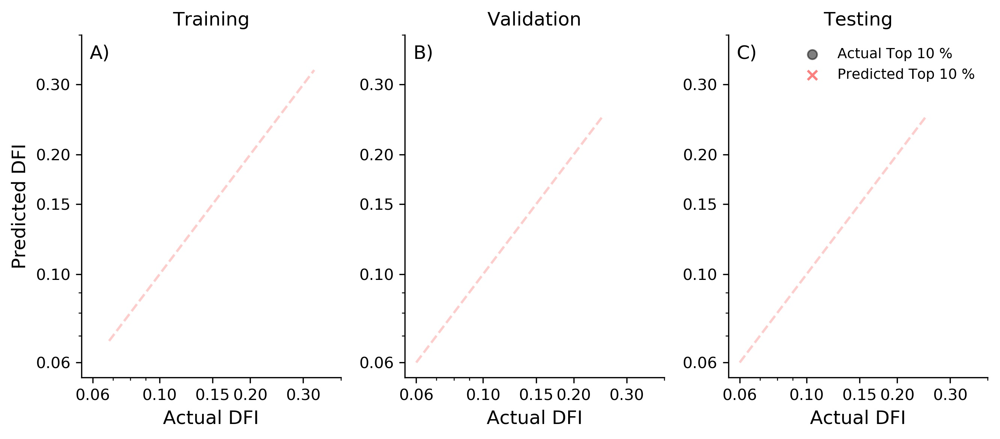

for sample 1 and top 20 %, p=1.61e-01, t=-1.41e+00
for sample 1 and top 10 %, p=4.17e-01, t=-8.17e-01
for sample 1 and top 5 %, p=6.01e-01, t=-5.29e-01


c:\programdata\anaconda3\envs\tensorflow\lib\site-packages\numpy\core\fromnumeric.py:3157: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
c:\programdata\anaconda3\envs\tensorflow\lib\site-packages\numpy\core\_methods.py:130: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
c:\programdata\anaconda3\envs\tensorflow\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
c:\programdata\anaconda3\envs\tensorflow\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
c:\programdata\anaconda3\envs\tensorflow\lib\site-packages\scipy\stats\_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


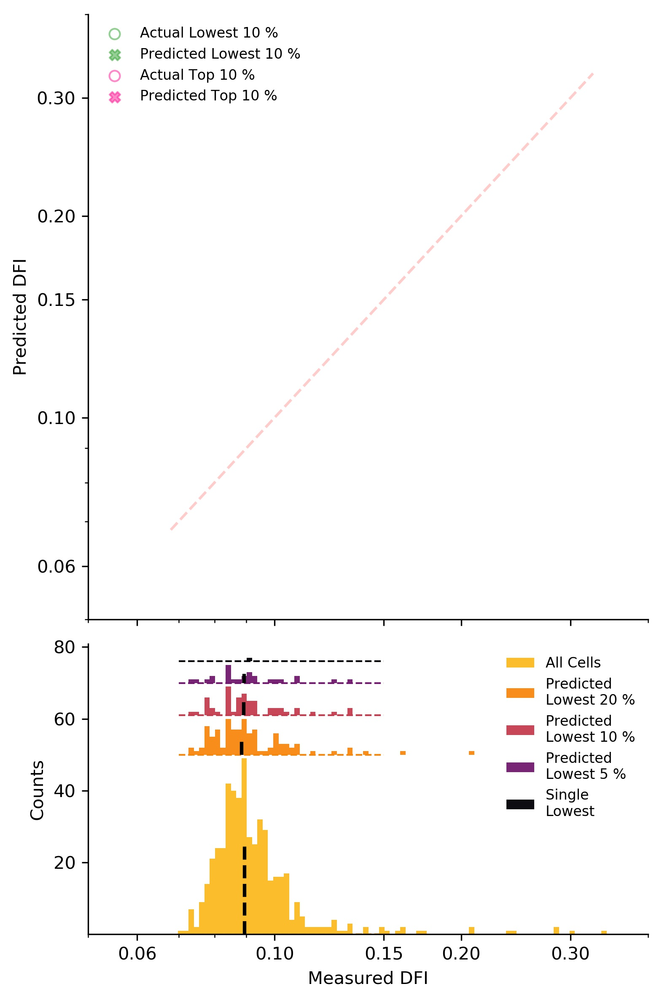

Found 150 images belonging to 1 classes.
looking at file D:_CNN_testing_data_set2_predictions_out0.csv
['443_S1_BF033_DFI_0993.' '444_S1_BF033_DFI_0905.'
 '445_S1_BF033_DFI_1020.' '446_S1_BF033_DFI_1003.'
 '447_S1_BF033_DFI_0888.']
total test images = 183
total final test images = 150
pearson R over sqrt(R2) = 1.00e+00
Overlap = 2 of 15, p = 0.283


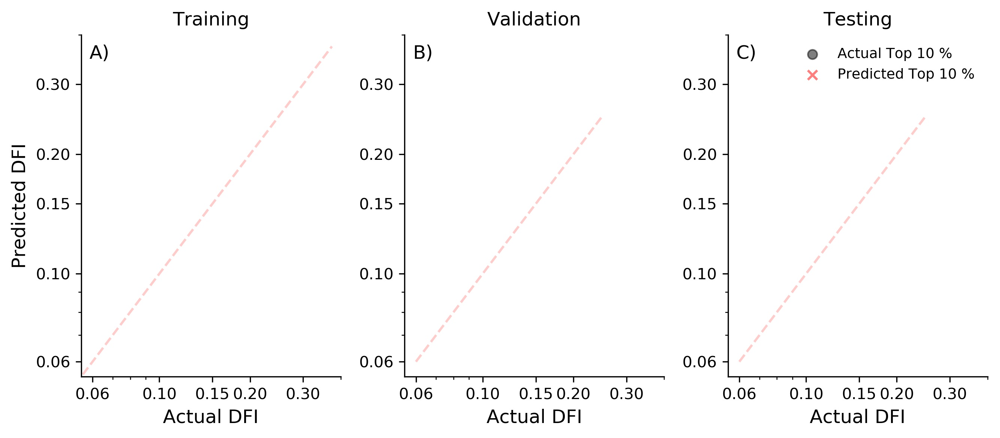

for sample 2 and top 20 %, p=8.74e-01, t=-1.60e-01
for sample 2 and top 10 %, p=9.39e-01, t=7.81e-02
for sample 2 and top 5 %, p=3.52e-01, t=-9.89e-01


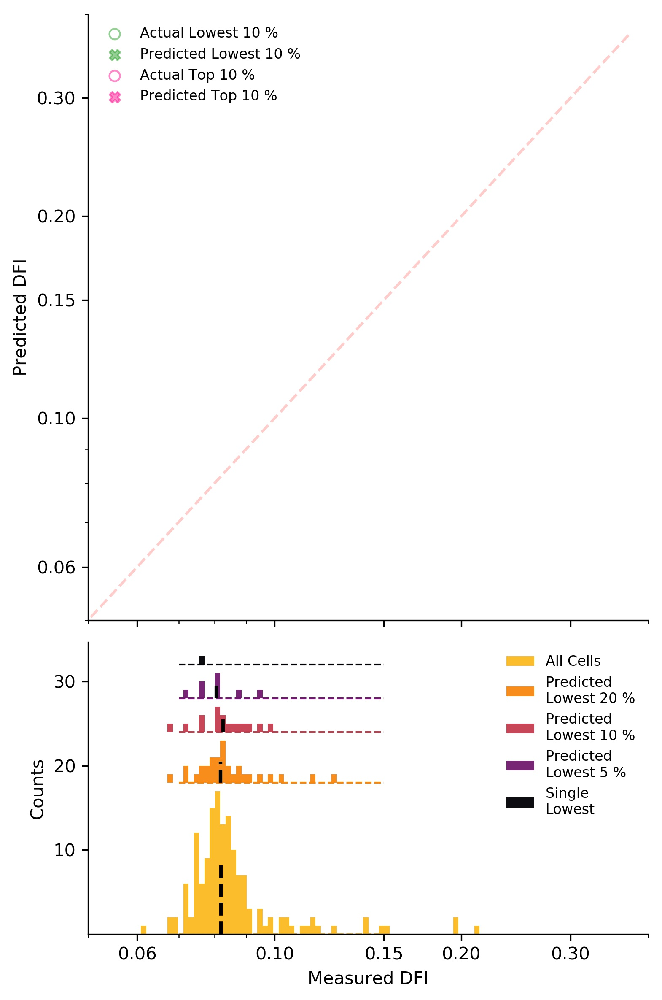

Found 111 images belonging to 1 classes.
looking at file D:_CNN_testing_data_set3_predictions_out0.csv
['593_S2_BF047_DFI_1956.' '594_S2_BF047_DFI_0757.'
 '595_S2_BF047_DFI_0728.' '596_S2_BF047_DFI_0767.'
 '597_S2_BF047_DFI_0790.']
total test images = 191
total final test images = 111
pearson R over sqrt(R2) = 1.00e+00
Overlap = 0 of 11, p = 0.299


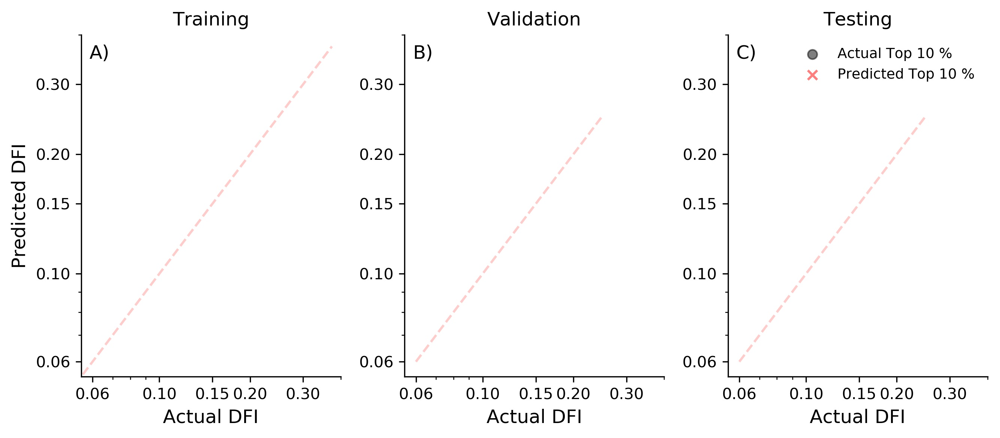

for sample 3 and top 20 %, p=9.93e-01, t=8.37e-03
for sample 3 and top 10 %, p=6.77e-01, t=4.25e-01
for sample 3 and top 5 %, p=5.77e-01, t=5.93e-01


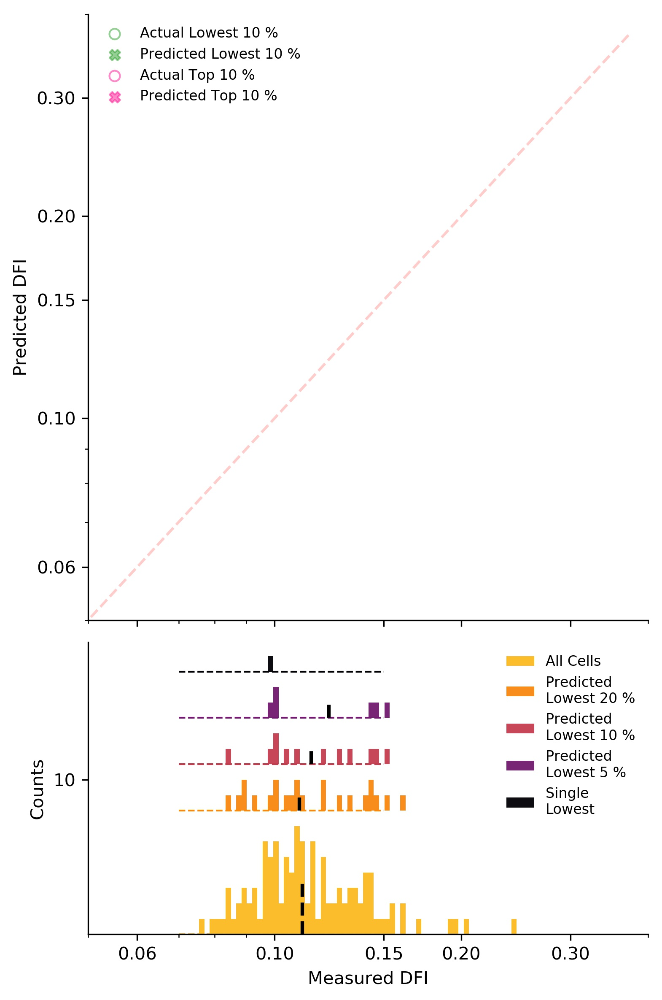

Found 89 images belonging to 1 classes.
looking at file D:_CNN_testing_data_set4_predictions_out0.csv
['704_S3_BF017_DFI_1414.' '705_S3_BF017_DFI_0988.'
 '706_S3_BF017_DFI_1228.' '707_S3_BF017_DFI_1224.'
 '708_S3_BF018_DFI_0973.']
total test images = 195
total final test images = 89
pearson R over sqrt(R2) = 1.00e+00
Overlap = 1 of 8, p = 0.394


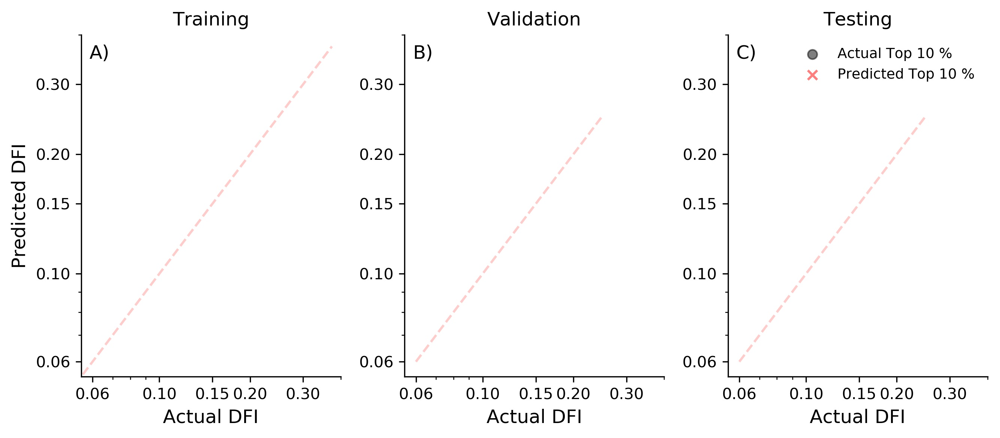

for sample 4 and top 20 %, p=7.28e-01, t=-3.52e-01
for sample 4 and top 10 %, p=7.85e-01, t=-2.81e-01
for sample 4 and top 5 %, p=7.56e-01, t=-3.31e-01


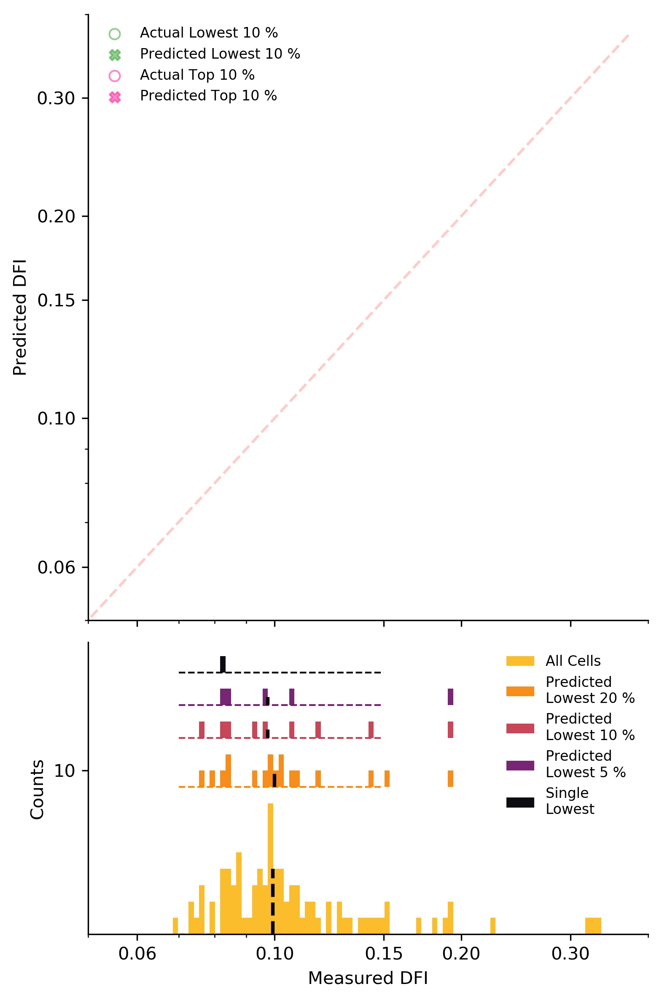

Found 73 images belonging to 1 classes.
looking at file D:_CNN_testing_data_set5_predictions_out0.csv
['793_S4_BF060_DFI_0770.' '794_S4_BF061_DFI_0793.'
 '795_S4_BF066_DFI_0849.' '796_S4_BF069_DFI_1302.'
 '797_S4_BF069_DFI_0790.']
total test images = 199
total final test images = 73
pearson R over sqrt(R2) = 1.00e+00
Overlap = 0 of 7, p = 0.478


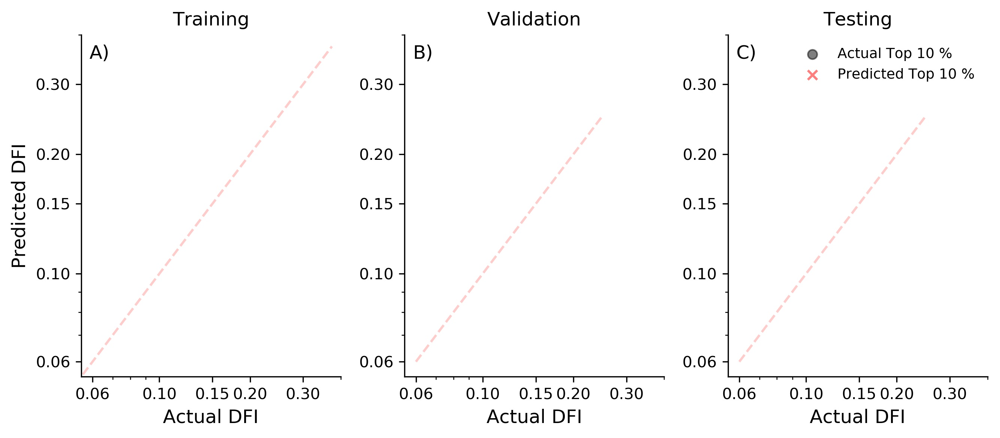

for sample 5 and top 20 %, p=7.84e-01, t=-2.78e-01
for sample 5 and top 10 %, p=6.10e-01, t=5.27e-01
for sample 5 and top 5 %, p=1.11e-01, t=2.06e+00


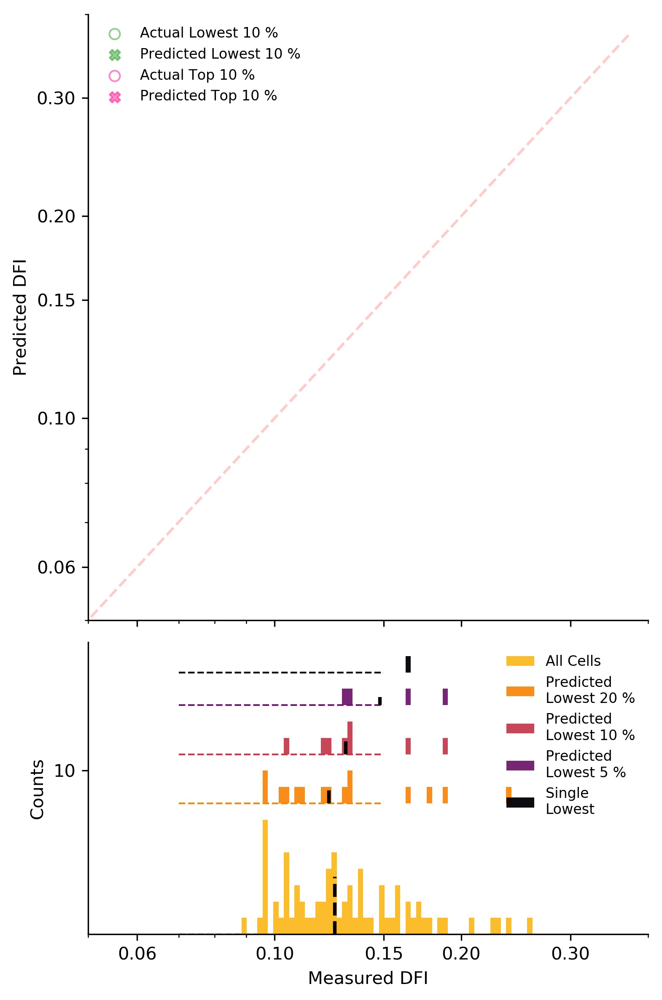

Found 134 images belonging to 1 classes.
looking at file D:_CNN_testing_data_set6_predictions_out0.csv
['866_S5_BF138_DFI_1051.' '867_S5_BF138_DFI_1054.'
 '868_S5_BF139_DFI_1875.' '869_S5_BF139_DFI_1223.'
 '870_S5_BF139_DFI_0943.']
total test images = 186
total final test images = 134
pearson R over sqrt(R2) = -1.00e+00
Overlap = 0 of 13, p = 0.248


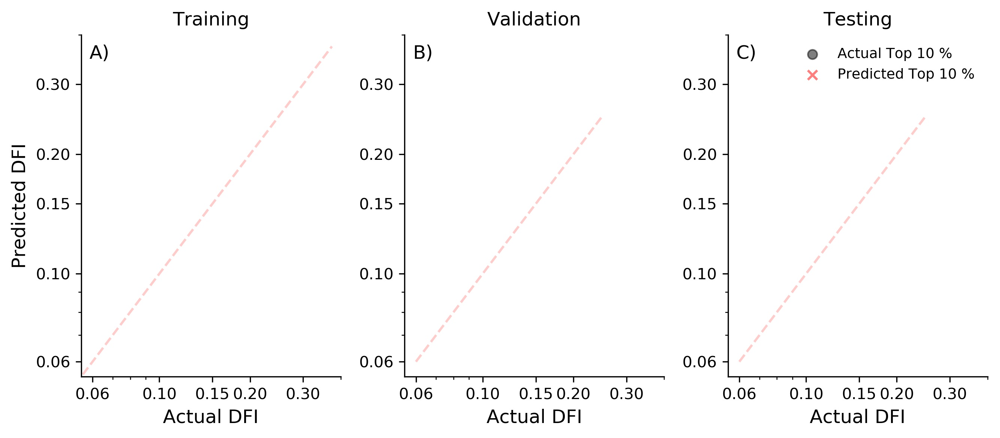

for sample 6 and top 20 %, p=6.26e-01, t=4.92e-01
for sample 6 and top 10 %, p=1.67e-01, t=1.45e+00
for sample 6 and top 5 %, p=2.00e-01, t=1.42e+00


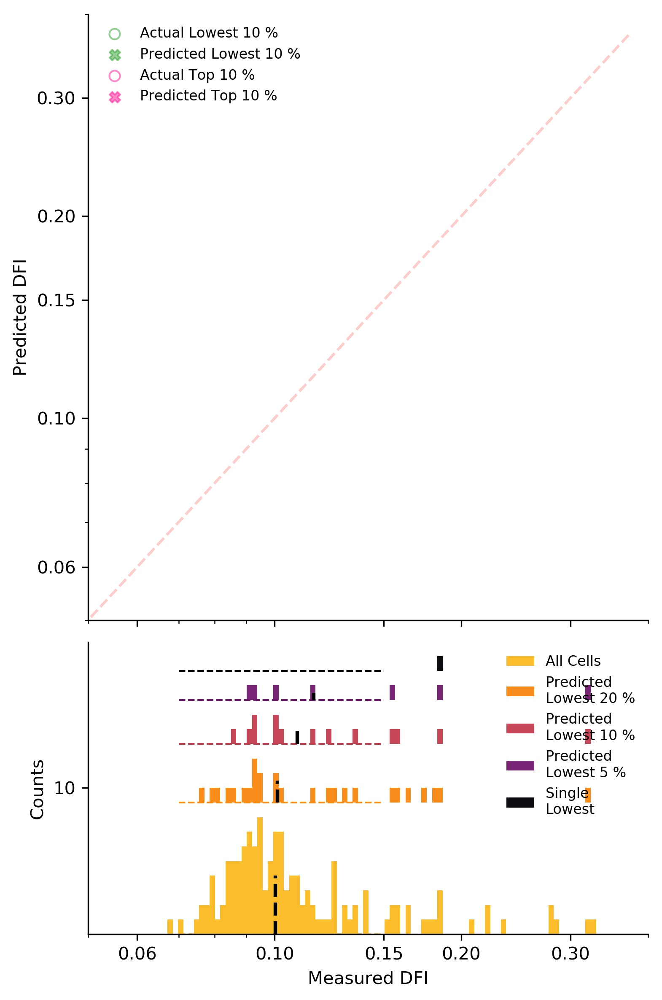

Found 213 images belonging to 1 classes.
looking at file D:_CNN_testing_data_set7_predictions_out0.csv
['001_S1_BF000_DFI_2373.' '006_S1_BF000_DFI_0966.'
 '011_S1_BF000_DFI_0992.' '016_S1_BF001_DFI_0965.'
 '021_S1_BF001_DFI_1050.']
total test images = 213
total final test images = 213
pearson R over sqrt(R2) = 1.00e+00
Overlap = 5 of 21, p = 0.031


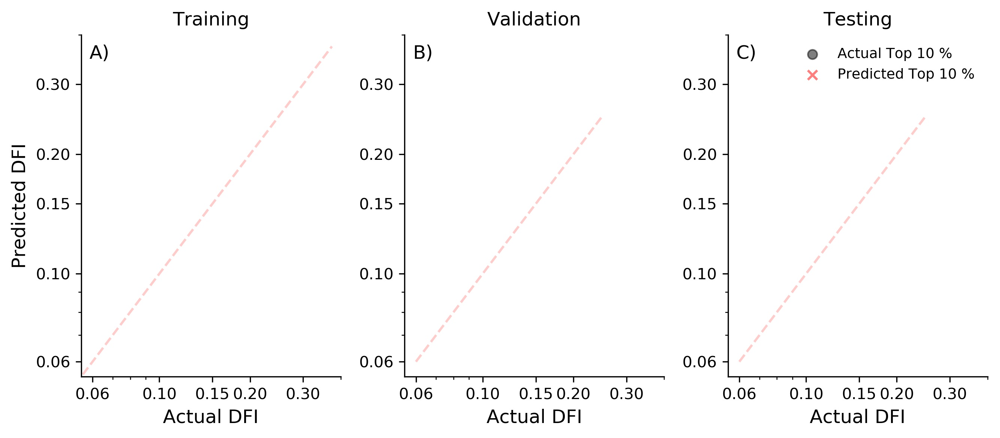

for sample 7 and top 20 %, p=8.03e-02, t=-1.78e+00
for sample 7 and top 10 %, p=1.01e-01, t=-1.70e+00
for sample 7 and top 5 %, p=8.46e-02, t=-1.89e+00


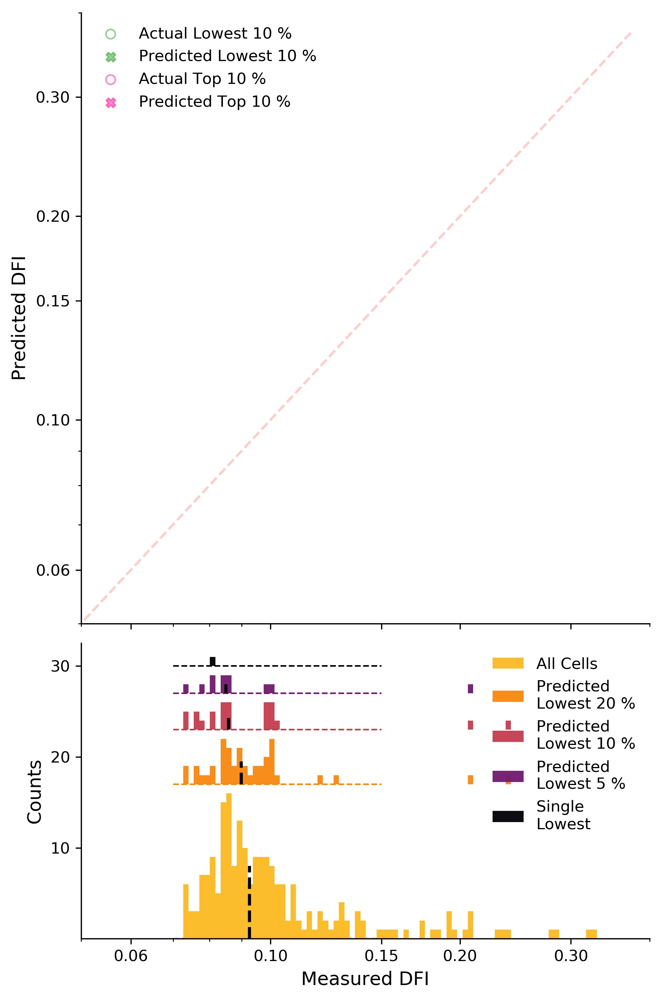

In [23]:
# plot all scatterplots but only test set: 
# plot actual top 10 vs pred top 10

from sklearn import linear_model
from sklearn.metrics import mutual_info_score, normalized_mutual_info_score
from sklearn.feature_selection import mutual_info_classif
from scipy.stats import norm
from scipy.special import comb
from scipy.stats import kendalltau, spearmanr, pearsonr, sem
from scipy.spatial.distance import correlation as dcorr
import cv2
import matplotlib.ticker as ticker
from matplotlib.ticker import StrMethodFormatter, NullFormatter, AutoMinorLocator
from scipy.stats import ttest_ind, mannwhitneyu

from matplotlib.offsetbox import (TextArea, DrawingArea, OffsetImage,
                                  AnnotationBbox)

# top_num = 10 # how many to compare, set to 10% of test set within loop
cmap = plt.cm.get_cmap('viridis')

# do we want lots of images comparing good and bad predictions?
make_img_plots = True

j_all = len(allDirs) # how many shuffled sets did we make?

# make big array with all R^2, rho, tau, 10% overlap
# rows: 7 different sets (6 donors plus ALL) + 1 row for percents
# cols: 5 values for 20/10/5 percents each + donor numbers + (pearson r + p-value) + single lowest % + mae + stdev
big_table_low_high_top_ten = np.zeros((7+1,5*3+1+2+1+1+1))

# make table with lowest-predicted 
# (cols = perc, D1,..., D6, all), (rows = 4*low_pred_perc_mean, 4*SD, Pearson r, p-value)
big_table_low_pred = np.zeros((8,4*2+1),dtype=np.ndarray)

biggest_table = np.zeros((8, 3*4))

## bins for histograms
make_x_log = True

final_top_num_percent = [100,20,10,5,1e-6]

if make_x_log:
    bins = np.logspace(np.log10(0.05),np.log10(0.35),num=100)
else:
    bins = np.linspace(0.05,0.35,100)
    
    
for i in range(j_all):
    
    # get test data to take images from
    data_dir = allDirs[i]
    sub_data_dir2b = os.path.join(data_dir, 'final_test', 'class0')
    label_file2b = os.path.join(sub_data_dir2b, 'labels_final_test.csv')
    df2b = pd.read_csv(label_file2b)
    labels2b = np.asarray(df2b)[:,1].tolist()
    new_labels2b = np.round(np.asarray(labels2b) * mult_DFI) /mult_DFI
    saved_model = saved_models[i]
    
    # create data generator for validation that only rescales
    datagen_test = ImageDataGenerator(
        rescale=1./255,
        preprocessing_function = None) # None
    
    final_test_dir = os.path.join(data_dir, 'final_test/')

#     # actual directory iterator that grabs images from final_test_dir
    # this should be un-shuffled
    generator_final_test = datagen_test.flow_from_directory(
        final_test_dir,
        target_size=(img_width, img_height),
        batch_size=128, #len(new_labels2b),
        shuffle=False,
        interpolation = interpolation,
        class_mode='binary')
    
    image_paths_final_test = path_join(final_test_dir, 
                                       generator_final_test.filenames)
    
    generator_final_test.classes = new_labels2b
    
    
    ## -------------- ##
    # now do regular scatterplot and histogram stuff
    ## -------------- ##
    
    
    num_file = i
    num_str = '%01d' % (num_file,)
    log_file = log_files[num_file]
    
    predictions_out = predictions_outs[i]

    jj=0
            
    # look at predictions file to see how well we did
    num_file2 = jj
    num_str2 = '%01d' % (num_file2,)
    new_iter_predictions_out = predictions_out.replace(
        'out', 'out' + num_str2)
    window_size = 3

    # look at log file to check final error/loss
    new_iter_log_file = log_file.replace('file', 'file'+num_str2)
    new_history = pd.read_csv(new_iter_log_file,sep=',')

    print('looking at file %s' % new_iter_predictions_out)

    predictions_out2_df = pd.read_csv(new_iter_predictions_out,sep=',')

    label0 = predictions_out2_df['1 label'].values
    test_train = predictions_out2_df['2 train_test'].values
    img_num_all = predictions_out2_df['0 img_num'].values

    y_pred_train = np.zeros((len(label0),num_classes))

    for i,name in enumerate(class_names):
        y_pred_train[:,i] = predictions_out2_df[str(i+4) + 'pred_' + name]
        new_history = pd.read_csv(new_iter_log_file,sep=',')

    ind_train = np.arange(0,len(label0))
    ind_train2 = ind_train[(test_train == 'train')]
    ind_test = ind_train[(test_train == 'test')]
    ind_final_test = ind_train[(test_train == 'final_test')]

    cls_pred_train = y_pred_train[ind_train2].reshape(-1,1)
    cls_pred_test = y_pred_train[ind_test].reshape(-1,1)
    cls_pred_final_test = y_pred_train[ind_final_test].reshape(-1,1)

    cls_train = label0[ind_train2].reshape(-1,1)
    cls_test = label0[ind_test].reshape(-1,1)
    cls_final_test = label0[ind_final_test].reshape(-1,1)

    img_name_all_train = np.asarray(img_num_all[ind_train2])
    img_name_all_test = np.asarray(img_num_all[ind_test])
    img_name_all_final_test = np.asarray(img_num_all[ind_final_test])

    print(img_name_all_final_test[:5])

    ## --------------- ##

    # Pearson r for just final test set
    pr_final_test, p_pr_final_test = pearsonr(cls_final_test, cls_pred_final_test)
    
    big_table_low_pred[num_file+1,0] = pr_final_test
    big_table_low_pred[num_file+1,1] = p_pr_final_test
    
    big_table_low_high_top_ten[num_file+1,17] = pr_final_test
    big_table_low_high_top_ten[num_file+1,18] = p_pr_final_test

    ## --------------- ##


    print('total test images = %s' % len(cls_test))
    print('total final test images = %s' % len(cls_final_test))


    ## find error between actual and predicted DFIs
    # find absolute difference between label and pred and sort
    ## ------------------ ##
    abs_diff_train = np.absolute(cls_pred_train - cls_train)
    abs_diff_test = np.absolute(cls_pred_test - cls_test)
    abs_diff_final_test = np.absolute(cls_pred_final_test - cls_final_test)

    # plot worst predictions for training set
    n_img_rows = 12
    n_img_cols = 4
    figsize=(n_img_cols,n_img_rows)
    dpi = 300

    fontScale = .75
    thickness = 2
    xcoord = 80
    ycoord = 20

    label_char = ['a','b','c','d','e','f','g','h']

    num_imgs_to_check = len(cls_final_test) // 10

    # worst predictions
    ind_argsort_train = np.argsort(abs_diff_train[:,0])[-num_imgs_to_check:]
    ind_argsort_test = np.argsort(abs_diff_test[:,0])[-num_imgs_to_check:]
    ind_argsort_final_test = np.argsort(
        abs_diff_final_test[:,0])[-(num_imgs_to_check):]

    # best predictions = '2'
    ind_argsort_train2 = np.argsort(abs_diff_train[:,0])[:num_imgs_to_check]
    ind_argsort_test2 = np.argsort(abs_diff_test[:,0])[:num_imgs_to_check]
    ind_argsort_final_test2 = np.argsort(
        abs_diff_final_test[:,0],axis=0)[:(1+num_imgs_to_check)]
    ind_argsort_final_test2=np.delete(ind_argsort_final_test2,num_imgs_to_check-1)        


    # sort train set and find number of overlaps
    sort_cls_train = np.argsort(cls_train,axis=0)
    sort_cls_pred_train = np.argsort(cls_pred_train,axis=0)

    top_num_train = len(cls_train)//10
    colors = cmap(np.linspace(0,1,top_num_train))

    sort_cls_train = sort_cls_train[:top_num_train]
    sort_cls_pred_train = sort_cls_pred_train[:top_num_train]

    n_unique_train = top_num_train*2-len(np.unique(
        sort_cls_train.tolist()+sort_cls_pred_train.tolist()))

    # sort test set and find number of overlaps
    sort_cls_test = np.argsort(cls_test,axis=0)
    sort_cls_pred_test = np.argsort(cls_pred_test,axis=0)

    top_num = len(cls_test)//10
    colors = cmap(np.linspace(0,1,top_num))

    sort_cls_test = sort_cls_test[:top_num]
    sort_cls_pred_test = sort_cls_pred_test[:top_num]

    n_unique = top_num*2-len(np.unique(
        sort_cls_test.tolist()+sort_cls_pred_test.tolist()))

    ## plot worst guesses of top ten
    error_top_cls_test = (cls_pred_test - cls_test)[:,0]


    # sort final_ test set and find number of overlaps
    sort_cls_final_test0 = np.argsort(cls_final_test,axis=0)
    sort_cls_pred_final_test0 = np.argsort(cls_pred_final_test,axis=0)

#         final_top_num = 10
    final_top_num = len(cls_final_test)//10
    final_colors = cmap(np.linspace(0,1,final_top_num))

    sort_cls_final_test = sort_cls_final_test0[:final_top_num]
    sort_cls_pred_final_test = sort_cls_pred_final_test0[:final_top_num]

    final_n_unique = final_top_num*2-len(np.unique(
        sort_cls_final_test.tolist()+sort_cls_pred_final_test.tolist()))


    ## plot worst guesses of top ten
    error_top_cls_final_test = np.absolute(cls_pred_final_test - cls_final_test)[:,0]


    # do R2 score and fit

    # create linear regression object
    regr = linear_model.LinearRegression()

    # train model using training sets
    regr.fit(cls_train/mult_DFI, 
             cls_pred_train/mult_DFI)

    R2_score_train = regr.score(cls_train/mult_DFI, 
             cls_pred_train/mult_DFI)

    coeff_train = regr.coef_
    int_train = regr.intercept_

    mse_train = mean_squared_error(
        cls_train/mult_DFI, 
        cls_pred_train/mult_DFI)

    mae_train = mean_absolute_error(
        cls_train/mult_DFI, 
        cls_pred_train/mult_DFI)

    rmse_train = np.sqrt(mse_train)

    # create linear regression object for testing
    regr_test = linear_model.LinearRegression()

    # train model using training sets
    regr_test.fit(cls_test/mult_DFI, 
             cls_pred_test/mult_DFI)

    R2_score_test = regr_test.score(cls_test/mult_DFI, 
             cls_pred_test/mult_DFI)
    

    coeff_test = regr_test.coef_
    int_test = regr_test.intercept_

    # create linear regression object for final_ testing
    regr_final_test = linear_model.LinearRegression()

    # train model using training sets
    regr_final_test.fit(cls_final_test/mult_DFI, 
             cls_pred_final_test/mult_DFI)

    R2_score_final_test = regr_final_test.score(cls_final_test/mult_DFI, 
             cls_pred_final_test/mult_DFI)

    print('pearson R over sqrt(R2) = %.2e' % (pr_final_test / np.sqrt(R2_score_final_test)))
    
    coeff_final_test = regr_final_test.coef_
    int_final_test = regr_final_test.intercept_

    mse_final_test = mean_squared_error(
        cls_final_test/mult_DFI, 
        cls_pred_final_test/mult_DFI)

    mae_final_test = mean_absolute_error(
        cls_final_test/mult_DFI, 
        cls_pred_final_test/mult_DFI)

    big_table_low_high_top_ten[num_file+1,19] = mae_final_test
    big_table_low_high_top_ten[num_file+1,20] = np.std(cls_final_test / mult_DFI)
    
    rmse_final_test = np.sqrt(mse_final_test)


    ## ------------------
    #  Begin plots 
    ## ------------------



    # plot all data
    plt.figure(figsize=(9,4),dpi=300)

    # plot training data
    ax = plt.subplot(1,3,1)

    plot_x = np.linspace(np.min(cls_train/mult_DFI), np.max(cls_train/mult_DFI),100)
    plot_x = plot_x.reshape(-1,1)

    plt.plot(plot_x, plot_x*coeff_train + int_train,':k',alpha=0.4)
    plt.plot(cls_train / mult_DFI, 
             cls_pred_train / mult_DFI, '.k', alpha=0.2)

    plt.plot(np.linspace(np.min(cls_train)/ mult_DFI,np.max(cls_train) / mult_DFI), 
             np.linspace(np.min(cls_train)/ mult_DFI,np.max(cls_train) / mult_DFI),
             '--r',alpha=0.2)


    ax.annotate(
        r'A)', 
        xy=(0.07, 0.93),  xycoords='axes fraction',
        size=12,
        wrap=True, ha='center')

    plt.ylabel('Predicted DFI',size=12)
    plt.xlabel('Actual DFI',size=12)
    plt.title('Training')
    plt.tight_layout()

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    ax.set_ylim(bottom=0.055)
    ax.set_ylim(top=0.4)
    ax.set_xlim(left=0.055)
    ax.set_xlim(right=0.4)
    ax.loglog()

    ax.set_xticks([0.06, 0.1, 0.15, .2, 0.3])
    ax.xaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))      
    ax.xaxis.set_minor_formatter(NullFormatter())

    ax.set_yticks([0.06, 0.1, 0.15, .2, 0.3])
    ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))
    ax.yaxis.set_minor_formatter(NullFormatter())


    # plot test data
    ax = plt.subplot(1,3,2)

    plt.plot(plot_x, plot_x*coeff_test + int_test,'--b',alpha=0.4)
    plt.plot(cls_test / mult_DFI, 
             cls_pred_test / mult_DFI, '.b', alpha=0.2)

    plt.plot(np.linspace(.06,.25), 
             np.linspace(.06,.25),
             '--r',alpha=0.2)

    ax.annotate(
        r'B)', 
        xy=(0.07, 0.93),  xycoords='axes fraction',
        size=12,
        wrap=True, ha='center')

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

#         plt.ylabel('Predicted DFI',size=12)
    plt.xlabel('Actual DFI',size=12)
    plt.title('Validation')
#         plt.legend(loc=1, prop={'size': 9}, frameon=False)
    plt.tight_layout()

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    ax.set_ylim(bottom=0.055)
    ax.set_ylim(top=0.4)
    ax.set_xlim(left=0.055)
    ax.set_xlim(right=0.4)
    ax.loglog()

    ax.set_xticks([0.06, 0.1, 0.15, .2, 0.3])
    ax.xaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))      
    ax.xaxis.set_minor_formatter(NullFormatter())

    ax.set_yticks([0.06, 0.1, 0.15, .2, 0.3])
    ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))
    ax.yaxis.set_minor_formatter(NullFormatter())


    # plot final test data
    ax = plt.subplot(1,3,3)

    plt.plot(plot_x, plot_x*coeff_final_test + int_final_test,'--b',alpha=0.4)
    plt.plot(cls_final_test / mult_DFI, 
             cls_pred_final_test / mult_DFI, '.b', alpha=0.2)

    plt.plot(np.linspace(.06,.25), 
             np.linspace(.06,.25),
             '--r',alpha=0.2)


    # plot top 10s now  for testing
    plt.scatter(cls_final_test[sort_cls_final_test] / mult_DFI, 
             cls_pred_final_test[sort_cls_final_test] / mult_DFI, marker='o',
                c='k',label='Actual Top %s %%' % 10, 
                alpha=0.5)

    plt.scatter(cls_final_test[sort_cls_pred_final_test] / mult_DFI, 
             cls_pred_final_test[sort_cls_pred_final_test] / mult_DFI, marker='x', 
                c='r', label='Predicted Top %s %%' % 10, 
                alpha=0.5)

    # find p-value for overlap we got
    NN = len(cls_final_test)
    nn = final_top_num
    k_samp = final_n_unique
    comb_prob = comb(nn,k_samp)*comb(NN-nn,nn-k_samp)/comb(NN,nn)

    print(r'Overlap = %d of %d, p = %.3f' % 
                       (final_n_unique, final_top_num,comb_prob))

    ax.annotate(
        r'C)', 
        xy=(0.07, 0.93),  xycoords='axes fraction',
        size=12,
        wrap=True, ha='center')

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

#         plt.ylabel('Predicted DFI',size=12)
    plt.xlabel('Actual DFI',size=12)
    plt.title('Testing')
    plt.legend(loc=1, prop={'size': 9}, frameon=False)
    plt.tight_layout()

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

    ax.set_ylim(bottom=0.055)
    ax.set_ylim(top=0.4)
    ax.set_xlim(left=0.055)
    ax.set_xlim(right=0.4)
    ax.loglog()

    ax.set_xticks([0.06, 0.1, 0.15, .2, 0.3])
    ax.xaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))      
    ax.xaxis.set_minor_formatter(NullFormatter())

    ax.set_yticks([0.06, 0.1, 0.15, .2, 0.3])
    ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))
    ax.yaxis.set_minor_formatter(NullFormatter())

    save_filename = data_dir0 + '/' + folder_name + '/' + 'DONOR_' + str(num_file+1) + '_scatter.svg'
    plt.savefig(save_filename)

    plt.show()


    ## replot ONLY final test set data
    # plot final test data for different ranges of top_num
    final_top_num_percent = [20,10,5]
    final_top_num_percent = [100,20,10,5,1e-6]
    cols_ii = [False, True, True, True, False]

    bottom = 0.
    
    if num_file == 6:
        plt.figure(figsize=(6,6*1.5),dpi=300)
        zoom = 0.15 * (6) / (2*8/3)
    else:
        plt.figure(figsize=(2*8/3,2*8/3*1.5),dpi=300)
        zoom = 0.2
        
    ax = plt.subplot2grid((3,1), (0,0), rowspan=2)
    ax2 = plt.subplot2grid((3,1), (2,0))

    actual_DFI_to_plot = []
    pred_DFI_to_plot = []
    img_name_to_plot = []
    img_subset_to_plot = []
    
    for ii,top_perc in enumerate(final_top_num_percent):

        if ii>0:
            top_num0 = int(len(cls_final_test)//(100/top_perc / 1))+1
        else:
            top_num0 = len(cls_final_test)
                
        make_perc = 1
        
        sort_cls_final_test = sort_cls_final_test0[:top_num0,0]
        sort_cls_pred_final_test = sort_cls_pred_final_test0[:top_num0,0]

        sort_cls_final_test2 = sort_cls_final_test0[-top_num0:,0]
        sort_cls_final_test2 = np.flip(sort_cls_final_test2)
        
        sort_cls_pred_final_test2 = sort_cls_pred_final_test0[-top_num0:,0]
        sort_cls_pred_final_test2 = np.flip(sort_cls_pred_final_test2)
        
            
            
        # we do more loops with histograms
        # so skip some
        iii=ii-1
        
        if cols_ii[ii]:            
            big_table_low_high_top_ten[0,(1+ii*5):(1+iii*5+5)] = top_perc
            big_table_low_high_top_ten[num_file+1,0] = num_file+1

            big_table_low_pred[0, (3+ii*2):(3 + iii*2+2)] = top_perc
        
        if ii==2:
            
            ax = plt.subplot2grid((3,1), (0,0), rowspan=2)

            plt.plot(plot_x, plot_x*coeff_final_test + int_final_test,'--k',alpha=0.4)

            plt.plot(cls_final_test / mult_DFI, 
                     cls_pred_final_test / mult_DFI, '.k', alpha=0.2)

            plt.plot(np.linspace(np.min(cls_train)/ mult_DFI,np.max(cls_train) / mult_DFI), 
                     np.linspace(np.min(cls_train)/ mult_DFI,np.max(cls_train) / mult_DFI),
                     '--r',alpha=0.2)


            # plot top 10s now  for testing
            plt.scatter(cls_final_test[sort_cls_final_test] / mult_DFI, 
                     cls_pred_final_test[sort_cls_final_test] / mult_DFI, 
                        marker='o',
                        facecolors='none',
                        edgecolors='C2',label='Actual Lowest %s %%' % int(top_perc), 
                        alpha=0.5)

            
            
            plt.scatter(cls_final_test[sort_cls_pred_final_test] / mult_DFI, 
                     cls_pred_final_test[sort_cls_pred_final_test] / mult_DFI, 
                        marker='X', 
                        c='C2', label='Predicted Lowest %s %%' % int(top_perc), 
                        alpha=0.5)
            
        if cols_ii[ii]:
            ## SINGLE-LOWEST
            low_single = np.argmin(np.absolute(cls_final_test[sort_cls_final_test0] - \
                                       cls_final_test[sort_cls_pred_final_test[0]]))

            low_perc = 100-100*np.argmin(np.absolute(cls_final_test[sort_cls_final_test0] - \
                                       cls_final_test[sort_cls_pred_final_test[0]]))/(len(cls_final_test)*1)

            DFI_diff = (cls_final_test[sort_cls_pred_final_test[0]]/mult_DFI - \
                        np.median(cls_final_test/mult_DFI))

            big_table_low_high_top_ten[num_file+1,1+5*3] = low_perc
            big_table_low_pred[num_file+1, 2] = low_perc

        if ii==2:
            # plot highest top 10s now  for testing
            plt.scatter(cls_final_test[sort_cls_final_test2] / mult_DFI, 
                     cls_pred_final_test[sort_cls_final_test2] / mult_DFI, 
                        marker='o',facecolors='none',
                        edgecolors='deeppink',label='Actual Top %s %%' % int(top_perc), 
                        alpha=0.5)
            
            plt.scatter(cls_final_test[sort_cls_pred_final_test2] / mult_DFI, 
                     cls_pred_final_test[sort_cls_pred_final_test2] / mult_DFI, 
                        marker='X', 
                        c='deeppink', label='Predicted Top %s %%' % int(top_perc), 
                        alpha=0.5)

            
        if cols_ii[ii]:
            ## t-test for different means

            # LOW PRED: test equal mean of actual DFI vs predicted lowest DFI
            t_stat0, pvalue0 = ttest_ind(cls_final_test/mult_DFI,
                     cls_final_test[sort_cls_pred_final_test] / mult_DFI,
                     equal_var=False)

            mean_diff_low = (np.median(cls_final_test/mult_DFI) - \
                            np.median(cls_final_test[sort_cls_pred_final_test]/mult_DFI))

            low_perc = 100-np.argmin(np.absolute(cls_final_test[sort_cls_final_test0] - \
                                       np.median(cls_final_test[sort_cls_pred_final_test])))/ \
                                        (len(cls_final_test))*100

            dof = len(cls_final_test[sort_cls_pred_final_test]) + \
                (len(cls_final_test[sort_cls_final_test0])*1) - 2

            nn = len(cls_final_test[sort_cls_pred_final_test])

            big_table_low_high_top_ten[num_file+1,(1+iii*5)] = low_perc
            big_table_low_high_top_ten[num_file+1,(2+iii*5)] = pvalue0
            big_table_low_high_top_ten[num_file+1,(3+iii*5)] = nn
            big_table_low_high_top_ten[num_file+1,(4+iii*5)] = dof
            big_table_low_high_top_ten[num_file+1,(5+iii*5)] = t_stat0


            low_perc_all = np.array([np.argmin(np.absolute(
                cls_final_test[sort_cls_final_test0] - val)) \
                           for val in cls_final_test[sort_cls_pred_final_test]])

            low_perc_all = 100 - low_perc_all/len(cls_final_test)*100
            big_table_low_pred[num_file+1, 3 + iii*2 + 0] = (low_perc_all)
            big_table_low_pred[num_file+1, 3 + iii*2 + 1] = sem(low_perc_all)

            biggest_table[0, iii+1] = top_perc
            biggest_table[num_file+1, iii+1] = mean_diff_low

            # find p-value for rankings instead of mean (look at mean of percentiles of top 10 vs all)
            t_stat1, pvalue1 = ttest_ind(np.linspace(0,100,len(cls_final_test)),
                     low_perc_all,
                     equal_var=False)

            print('for sample %d and top %d %%, p=%.2e, t=%.2e' % 
                  (num_file+1, top_perc, pvalue1, t_stat1))
            

        ## high DFI

        # HIGH PRED: test equal mean of actual DFI vs predicted lowest DFI
        t_stat0, pvalue0 = ttest_ind(cls_final_test/mult_DFI,
                 cls_final_test[sort_cls_pred_final_test2] / mult_DFI,
                 equal_var=False)

        mean_diff_low = np.absolute(np.mean(cls_final_test/mult_DFI) - \
                        np.mean(cls_final_test[sort_cls_pred_final_test2]/mult_DFI))

        low_perc = 100-np.argmin(np.absolute(cls_final_test[sort_cls_final_test0] - \
                                   np.median(cls_final_test[sort_cls_pred_final_test2])))/\
        len(cls_final_test)*100

        if ii==2:

            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

            if num_file==6:
                plt.ylabel('Predicted DFI',size=12)
            else:
                plt.ylabel('Predicted DFI',size=10)
    
            if num_file==6:
                plt.legend(loc=2, prop={'size': 10}, frameon=False)
            else:
                plt.legend(loc=2, prop={'size': 8}, frameon=False)

            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

            ax.set_ylim(bottom=0.05)
            ax.set_ylim(top=0.4)
            ax.set_xlim(left=0.05)
            ax.set_xlim(right=0.4)
            ax.loglog()

            ax.set_xticks([0.06, 0.1, 0.15, .2, 0.3])
#             ax.xaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))   
            ax.set_xticklabels([])
            ax.xaxis.set_minor_formatter(NullFormatter())

            ax.set_yticks([0.06, 0.1, 0.15, .2, 0.3])
            ax.yaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))
            ax.yaxis.set_minor_formatter(NullFormatter())

            
        if ii==3:          
            
            ## -------------- ##
            ## plot images onto scatterplot
            ## -------------- ##
            
            ## append lists with actual and predicted DFI AND image name
            actual_DFI_to_plot.append((cls_final_test[sort_cls_final_test] / mult_DFI).reshape(-1,1))
            pred_DFI_to_plot.append((cls_pred_final_test[sort_cls_final_test] / mult_DFI).reshape(-1,1))
            img_name_to_plot.append(img_name_all_final_test[sort_cls_final_test].reshape(-1,1))
            img_subset_to_plot.append(
                1 * np.ones(len(img_name_all_final_test[sort_cls_final_test].reshape(-1,1))))
            
            ## append lists with actual and predicted DFI AND image name
            actual_DFI_to_plot.append((cls_final_test[sort_cls_pred_final_test] / mult_DFI).reshape(-1,1))
            pred_DFI_to_plot.append((cls_pred_final_test[sort_cls_pred_final_test] / mult_DFI).reshape(-1,1))
            img_name_to_plot.append(img_name_all_final_test[sort_cls_pred_final_test].reshape(-1,1))
            img_subset_to_plot.append(
                2 * np.ones(len(img_name_all_final_test[sort_cls_pred_final_test].reshape(-1,1))))
            
            ## append lists with actual and predicted DFI AND image name
            actual_DFI_to_plot.append((cls_final_test[sort_cls_final_test2] / mult_DFI).reshape(-1,1))
            pred_DFI_to_plot.append((cls_pred_final_test[sort_cls_final_test2] / mult_DFI).reshape(-1,1))
            img_name_to_plot.append(img_name_all_final_test[sort_cls_final_test2].reshape(-1,1))
            img_subset_to_plot.append(
                3 * np.ones(len(img_name_all_final_test[sort_cls_final_test2].reshape(-1,1))))

            ## append lists with actual and predicted DFI AND image name
            actual_DFI_to_plot.append((cls_final_test[sort_cls_pred_final_test2] / mult_DFI).reshape(-1,1))
            pred_DFI_to_plot.append((cls_pred_final_test[sort_cls_pred_final_test2] / mult_DFI).reshape(-1,1))
            img_name_to_plot.append(img_name_all_final_test[sort_cls_pred_final_test2].reshape(-1,1))
            img_subset_to_plot.append(
                4 * np.ones(len(img_name_all_final_test[sort_cls_pred_final_test2].reshape(-1,1))))
            
            
            final_test_imgs_to_plot = pd.DataFrame(
                {'actual_DFI': np.asarray(actual_DFI_to_plot).flatten(),
                 'pred_DFI': np.asarray(pred_DFI_to_plot).flatten(),
                 'img_name': np.asarray(img_name_to_plot).flatten(),
                 'img_subset': np.asarray(img_subset_to_plot).flatten()})

            
            # img subset = actual low, pred low, actual high, pred high            
            final_test_imgs_to_plot = final_test_imgs_to_plot.drop_duplicates(
                subset='img_name')
            
            final_test_imgs_to_plot = final_test_imgs_to_plot.reset_index()

            offset1 = 0.06
            offset2 = 0.06
            offset3 = 0.06
            offset4 = 0.06
            
            count1 = 0
            count2 = 0
            count3 = 0
            count4 = 0
            
            for img_num in range(len(final_test_imgs_to_plot)):

                img_folder = os.path.join(os.getcwd(), data_dir0, 
                                        'set%s' % (num_file+1), 
                                        'final_test', 'class0')           

                img_filenames = [os.path.join(img_folder, f) for f in os.listdir(img_folder) 
                                 if final_test_imgs_to_plot['img_name'][img_num] in f]
                
                if len(img_filenames) == 1:
                    arr_img = plt.imread(img_filenames[0])
                elif not img_filenames:
                    print('continued')
                    continue            
                else:
                    arr_img = plt.imread(img_filenames)                
                    
                imagebox = OffsetImage(arr_img, zoom=zoom)
                imagebox.image.axes = ax

                xy = (final_test_imgs_to_plot['actual_DFI'][img_num],
                     final_test_imgs_to_plot['pred_DFI'][img_num])

                fc = 'k'
                
                # actual lowest
                if final_test_imgs_to_plot['img_subset'][img_num] == 1.:
                    
                    median_plot = np.median(
                        final_test_imgs_to_plot['pred_DFI'][
                            final_test_imgs_to_plot['img_subset'] == 1.])
                    xbox = (0.06,
                        final_test_imgs_to_plot['pred_DFI'][img_num] + \
                            (final_test_imgs_to_plot['pred_DFI'][img_num] - median_plot) * 0.5)
            
                    fc = 'darkgreen'
                    
                    count1 += 1
                    
                    if count1>10:
                        continue
                    
                # predicted lowest
                elif final_test_imgs_to_plot['img_subset'][img_num] == 2.:
                    
                    median_plot = np.median(
                        final_test_imgs_to_plot['actual_DFI'][
                            final_test_imgs_to_plot['img_subset'] == 2.])
        
                    xbox = (final_test_imgs_to_plot['actual_DFI'][img_num] + \
                            (final_test_imgs_to_plot['actual_DFI'][img_num] - median_plot) * 0.5,
                           0.06)
            
                    fc = 'darkgreen'
                    
                    count2 += 1
                    
                    if count2>10:
                        continue
                
                # actual highest
                elif final_test_imgs_to_plot['img_subset'][img_num] == 3.:
                    
                    median_plot = np.median(
                        final_test_imgs_to_plot['pred_DFI'][
                            final_test_imgs_to_plot['img_subset'] == 3.])
        
                    xbox = (0.25,
                        final_test_imgs_to_plot['pred_DFI'][img_num] + \
                           (final_test_imgs_to_plot['pred_DFI'][img_num] - median_plot) * 0.5)
                
                    fc = 'deeppink'
                    
                    count3 += 1
                    
                    if count3>10:
                        continue
                    
                # predicted highest
                elif final_test_imgs_to_plot['img_subset'][img_num] == 4.:
                    
                    median_plot = np.median(
                        final_test_imgs_to_plot['actual_DFI'][
                            final_test_imgs_to_plot['img_subset'] == 4.])
                    
                    xbox = (final_test_imgs_to_plot['actual_DFI'][img_num] + \
                            (final_test_imgs_to_plot['actual_DFI'][img_num] - median_plot) * 0.5,
                           0.25)
                
                    fc = 'deeppink'                    
                    
                    count4 += 1
                    
                    if count4>10:
                        continue
                    
                    
                ab = AnnotationBbox(imagebox, xy,
                                    xybox=xbox,
                                    xycoords='data',
                                    boxcoords='data',
                                    bboxprops=dict(ec=fc, lw=2),
                                    pad=0.001,
                                    arrowprops=dict(
                                        arrowstyle="-", lw=.5)
                                    )

                ax.add_artist(ab)
                plt.gray()
            
            
        if ii==4:
             ## -------------- ##
            # best predictions
             ## -------------- ##
                
            # ind_argsort_final_test2 ## best predictions final test set
            ## append lists with actual and predicted DFI AND image name
            actual_DFI_to_plot = ((cls_final_test[ind_argsort_final_test2] / mult_DFI).reshape(-1,1))
            pred_DFI_to_plot = ((cls_pred_final_test[ind_argsort_final_test2] / mult_DFI).reshape(-1,1))
            img_name_to_plot = (img_name_all_final_test[ind_argsort_final_test2].reshape(-1,1))
            img_subset_to_plot = (
                5 * np.ones(len(img_name_all_final_test[ind_argsort_final_test2].reshape(-1,1))))

            
            ## -------------- ##
            ## plot images onto scatterplot
            ## -------------- ##
            final_test_imgs_to_plot = pd.DataFrame(
                {'actual_DFI': np.asarray(actual_DFI_to_plot).flatten(),
                 'pred_DFI': np.asarray(pred_DFI_to_plot).flatten(),
                 'img_name': np.asarray(img_name_to_plot).flatten(),
                 'img_subset': np.asarray(img_subset_to_plot).flatten()})
            
            final_test_imgs_to_plot = final_test_imgs_to_plot.reset_index()

            offset1 = 0.06
            offset2 = 0.06
            offset3 = 0.06
            offset4 = 0.06
            
            count_best_pred = 0
            
            for img_num in range(len(final_test_imgs_to_plot)):

                img_folder = os.path.join(os.getcwd(), data_dir0, 
                                            'set%s' % (num_file+1), 
                                            'final_test', 'class0')
                
                img_filenames = [os.path.join(img_folder, f) for f in os.listdir(img_folder) 
                                 if final_test_imgs_to_plot['img_name'][img_num] in f]
    
                if len(img_filenames) == 1:
                    arr_img = plt.imread(img_filenames[0])
                elif not img_filenames:
                    print('continued')
                    continue            
                else:
                    arr_img = plt.imread(img_filenames)

                imagebox = OffsetImage(arr_img, zoom=zoom)
                imagebox.image.axes = ax

                xy = (final_test_imgs_to_plot['actual_DFI'][img_num],
                     final_test_imgs_to_plot['pred_DFI'][img_num])
                
                median_plot = np.median(
                    final_test_imgs_to_plot['actual_DFI'][
                        final_test_imgs_to_plot['img_subset'] == 5.])

                median_plot2 = np.median(
                    final_test_imgs_to_plot['pred_DFI'][
                        final_test_imgs_to_plot['img_subset'] == 5.])

                if (final_test_imgs_to_plot['actual_DFI'][img_num] - \
                    final_test_imgs_to_plot['pred_DFI'][img_num]) > 0:
                    
                    shift_over = 0.02
                    shift_over2 = -0.05
                else:
                    shift_over = -0.02
                    shift_over2 = 0.05
                    
                xbox = (final_test_imgs_to_plot['actual_DFI'][img_num] + shift_over + \
                        (final_test_imgs_to_plot['actual_DFI'][img_num] - median_plot) * 0.2,
                        final_test_imgs_to_plot['pred_DFI'][img_num] + shift_over2 + \
                        (final_test_imgs_to_plot['pred_DFI'][img_num] - median_plot2) * 0.2)

                fc = 'blue'                    
                    
                count_best_pred += 1
                
                if count_best_pred>10:
                    continue
                    
                ab = AnnotationBbox(imagebox, xy,
                                    xybox=xbox,
                                    xycoords='data',
                                    boxcoords='data',
                                    bboxprops=dict(ec=fc, lw=2),
                                    pad=0.001,
                                    arrowprops=dict(
                                        arrowstyle="-", lw=.5)
                                    )

                ax.add_artist(ab)
                plt.gray()
                
                
                
                
        ## ---------------- ##
        ## ---------------- ##

        ## now make histogram below scatterplot

        ## ---------------- ##
        ## ---------------- ##

        cmap = plt.cm.get_cmap('inferno_r')
        N = 20
        colors = cmap(np.linspace(0,1,N))


        if ii==0:
            color=colors[3]
            label='All Cells'

        elif ii<4:
            color=colors[ii*4+1]
            label='Predicted \nLowest %s %%' % top_perc

        else:
            color=colors[N-1]
            label='Single \nLowest'

        ax2.plot(np.linspace(0.07,0.15,10), bottom * np.ones(10), 
                 '--', color=color,lw=1)

        hist, xbins = np.histogram(cls_final_test[sort_cls_pred_final_test]/mult_DFI,
                                   bins=bins)

        ax2.hist(cls_final_test[sort_cls_pred_final_test]/mult_DFI,
                 bins=bins, 
                 alpha=0.95, color=color,
                 label=label,
                 bottom=bottom)
        
        if ii<4:
            ax2.plot(np.ones(10) * np.median(cls_final_test[sort_cls_pred_final_test]/mult_DFI),
                     np.linspace(bottom, bottom + np.max(hist)/2, 10), '--k', lw=2)

        if num_file>0:
            yticks = [10,20,30,40, 50, 60,70,80,90,100]
        else:
            yticks = [20,40,60,80,100]

        if ii==0:
            ax2.set_yticks(yticks)
            ax2.set_yticklabels(np.asarray(yticks,dtype=str))

        bottom += max(hist) +1

        if num_file==6:
            ax2.legend(loc=1, prop={'size': 10}, frameon=False)
        else:
            ax2.legend(loc=1, prop={'size': 8}, frameon=False)
            

       
        ax2.set_xlim(left=0.05)
        ax2.set_xlim(right=0.4)
        ax2.semilogx()

        ax2.set_xticks([0.06, 0.1, 0.15, .2, 0.3])
        ax2.xaxis.set_major_formatter(StrMethodFormatter('{x:.2f}'))      
        ax2.xaxis.set_minor_formatter(NullFormatter())            
          
        if num_file==6:
            ax2.set_ylabel('Counts',size=12)
            ax2.set_xlabel('Measured DFI',size=12)
        else:
            ax2.set_ylabel('Counts',size=10)
            ax2.set_xlabel('Measured DFI',size=10)
        
        ax2.spines['top'].set_visible(False)
        ax2.spines['right'].set_visible(False)
      
        
    plt.tight_layout()
    
    save_filename = data_dir0 + '/' + folder_name + '/' + 'DONOR_' + \
            str(num_file+1) + '_scatter_hist_test'
    plt.savefig(save_filename + '.svg')
    plt.savefig(save_filename + '.png', dpi=100)

    plt.show()



## make table for p-values of high/low top

In [24]:
print(pd.DataFrame(big_table_low_high_top_ten))
save_folder = data_dir0 + '/' + folder_name + '/'
csv_header = 'Donor, %, p, n, dof, t, %%, p, n, dof, t, %, p, n, dof, t, %, r, p,mae,'
np.savetxt(save_folder + 'high_low_perc_rank_and_p_values.csv', big_table_low_high_top_ten, delimiter=",",
          fmt='%.4e', header=csv_header)

    0          1         2      3      4         5          6         7   \
0  0.0   0.000000  0.000000    0.0    0.0  0.000000   0.000000  0.000000   
1  1.0  56.410256  0.116756  102.0  607.0  1.574139  52.662722  0.055570   
2  2.0  52.000000  0.342217   31.0  179.0  0.955711  46.666667  0.110392   
3  3.0  53.153153  0.873012   23.0  132.0  0.160975  42.342342  0.851113   
4  4.0  49.438202  0.341723   18.0  105.0  0.962006  59.550562  0.741873   
5  5.0  57.534247  0.997259   15.0   86.0  0.003482  45.205479  0.896066   
6  6.0  47.761194  0.578595   27.0  159.0 -0.560562  35.820896  0.376923   
7  7.0  58.215962  0.058317   43.0  254.0  1.921117  71.361502  0.412788   

     8      9     ...            11        12    13     14        15  \
0   0.0    0.0    ...      0.000000  0.000000   0.0    0.0  0.000000   
1  51.0  556.0    ...     52.662722  0.186804  26.0  531.0  1.343435   
2  16.0  164.0    ...     61.333333  0.050128   8.0  156.0  2.119548   
3  12.0  121.0    ...     3

## Make new fig with error bars instead of table for low-pred perc and pearson r

[ 2  4  6  8 10 12  0]


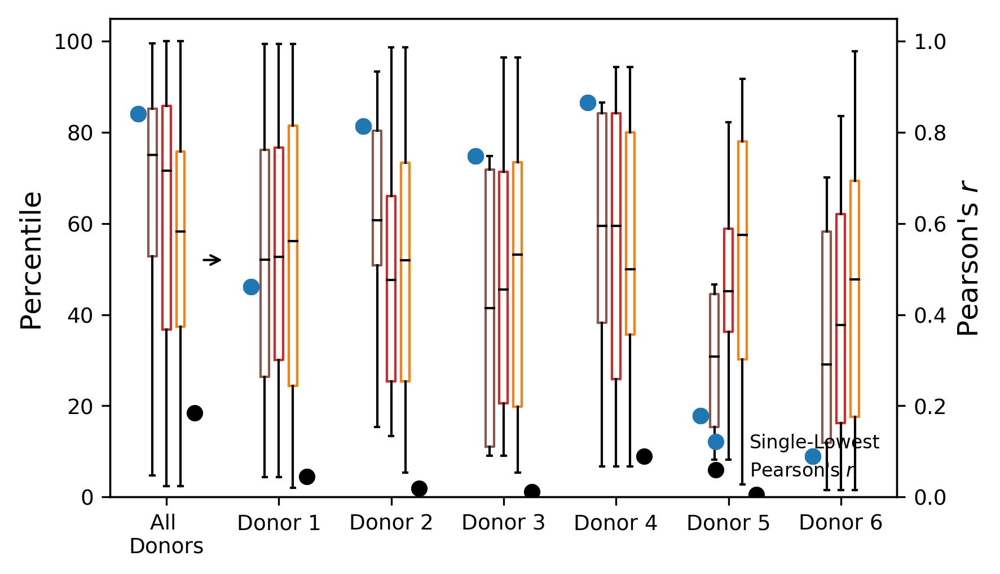

In [26]:
plt.figure(figsize=(6,6/1.6), dpi=300)
ax = plt.gca()

fmts = ['s','X','d','o']

perc_labels = ['20 %', '10 %' , '5 %', 'Single-Lowest']

xx = np.arange(2,15,2)

new_colors = ['k','r','b']

xx[-1] = 0
print(xx)

for i in [3,5,7]:
    
    if i==7:
        label = perc_labels[-1]
        ax.plot(xx-.5, big_table_low_pred[1:8, 2], fmts[-1] + 'C%s' % 0,
            label = label)
    else:
        ax.plot(xx-.5, big_table_low_pred[1:8, 2], fmts[-1] + 'C%s' % 0)
        
    if i==7:
        ax.plot(0,120, 'ok', label="Pearson's $\mathit{r}$")
      
    plt.boxplot(big_table_low_pred[1:8, i], notch=False, 
               positions = -.5+xx-(i-9)*0.125,
               widths = 0.15,
               whis=20.5,
               sym='k.',
               boxprops=dict(color='C%s' % (i-2)),
               medianprops=dict(color='k'))
    
#     ax.errorbar(xx+(i-9)*.05,big_table_low_pred[2:8, i],  
#                  xerr=0, 
#                  yerr=big_table_low_pred[2:8, i+1],
#                  fmt=fmts[(i-2)//2] + 'C%s' % i,
#                  alpha=0.6,
#                  label=perc_labels[(i-2)//2])
    
xticks0 = xx
xticks = ['Donor ' + str(i) for i in range(1,8)]
xticks[-1] = 'All \nDonors'

ax.set_xticks(xticks0)
ax.set_xticklabels(xticks, size=9)
ax.set_xlim(-1,13)

ax.set_ylim(0,105)
ax.set_ylabel('Percentile', size=12)

yticks = np.arange(0,110,20)
ax.set_yticklabels(np.asarray(yticks, dtype=str), size=9)

plt.legend(loc=4, prop={'size': 8}, frameon=False)

ax2 = ax.twinx()
ax2.plot(xx+.5,big_table_low_pred[1:8, 0], 'ok', label="Pearson's $\mathit{r}$")
ax2.set_ylabel("Pearson's $\mathit{r}$", size=12)
ax2.set_ylim(0,1.05)

yticks = np.arange(0,110,20)/100
ax2.set_yticklabels(np.asarray(yticks, dtype=str), size=9)

x1=1.4-.32
x2=0.9-.32
y1=.52
y2=.52
ax2.annotate("",
                xy=(x1, y1), xycoords='data',
                xytext=(x2, y2), textcoords='data',
                arrowprops=dict(arrowstyle="->"))

# ax2.legend(loc=3, prop={'size':9}, frameon=False)

save_filename = data_dir0 + '/' + folder_name + '/' + 'newfigs_fig3_perc_pearson_v0.svg'
plt.savefig(save_filename)

save_filename = data_dir0 + '/' + folder_name + '/' + 'newfigs_fig3_perc_pearson_v0.png'
plt.savefig(save_filename, dpi=300)
    
plt.show()


## Make average saliency plots

In [29]:
from matplotlib.colors import LogNorm

def saliency_visualization_avg(data_generator, sample_size=5, set=0):
    image, labels = data_generator.next()

    cmap2 = 'inferno_r'
    cmap2 = 'CMRmap_r'
#     cmap2 = 'afmhot_r'
#     cmap2 = 'gist_stern_r'
#     cmap2 = 'cubehelix_r'
#     cmap2 = 'magma_r'
#     cmap2 = 'gist_yarg'
#     cmap2 = 'gist_heat_r'
    
    sample_size2 = len(labels)
    
    labels_argsort = np.argsort(labels)
    
    labels_arglow = labels_argsort[:sample_size]
    labels_arghigh = labels_argsort[-sample_size:]
    labels_median = labels_argsort[(len(labels)//2-sample_size):(len(labels)//2 + sample_size)]
    
    all_inds_to_plot = [labels_arglow[2], labels_arglow[4],
                        labels_median[2], labels_median[4],
                        labels_arghigh[2], labels_arghigh[4],
                        labels_arglow[6], labels_arglow[8],
                        labels_median[6], labels_median[8],
                        labels_arghigh[6], labels_arghigh[8]]
    
    # make figure that has four mini examples each for median/low/high DFI
    # then one big one for average images of median/low/high
    
    nrows = 4
    ncols = 6
    iiter = 0 # iterate through all_inds_to_plot
    
    plt.figure(figsize=(6*(3),4*(3)), dpi=100)
    
    for ii in range(nrows//2):
        for jj in range(ncols):
            
            ind_to_plot = all_inds_to_plot[iiter]
            iiter+=1
            ax = plt.subplot2grid((nrows,ncols), (ii,jj))
    
            # plot one BF image
            img_num0 = labels_argsort[ind_to_plot]
            reference = image[img_num0]

            plt.imshow(reference, cmap='gray')
            plt.title(labels[ind_to_plot])
            plt.xticks([])
            plt.yticks([])
    
            ## plot saliency map of that BF image
            maps = []
            for i in [img_num0]:
                saliency = GradientSaliency(model_new, 0)
                saliency_map = saliency.get_mask(image[i])
                saliency_map[saliency_map<0] = 0
                saliency_map = saliency_map / np.max(saliency_map)
                maps.append(saliency_map[0])

            saliency_maps = np.stack(maps)
            saliency_maps = np.max(saliency_maps, axis=3)
            reference = np.mean(saliency_maps, axis=0)
            
            reference = np.ma.masked_where(reference < 0.05, reference)
            plt.imshow(reference, cmap=cmap2, alpha=0.6, 
                       vmin=0.001, vmax=0.5, interpolation='none')

            plt.xticks([])
            plt.yticks([])

            del saliency_maps
            del reference
            del maps
           
    
    
    
    ## ------------- ## 
    # plot low labels
    ## ------------- ## 
    
    reference = np.mean(image[labels_arglow],axis=0)

    ax = plt.subplot2grid((nrows,ncols), (2,0), rowspan=2, colspan=2)
    plt.imshow(reference, cmap='gray')
    plt.title('Lowest DFI Mean')
    plt.xticks([])
    plt.yticks([])
    
    maps = []
    for i in labels_arglow.tolist():
        saliency = GradientSaliency(model_new, 0)         
        saliency_map = saliency.get_mask(image[i])
        saliency_map[saliency_map<0] = 0
        saliency_map = saliency_map / np.max(saliency_map)
        maps.append(saliency_map[0])
        
    saliency_maps = np.stack(maps)
    saliency_maps = np.max(saliency_maps, axis=3)
    reference = np.mean(saliency_maps, axis=0)

    reference = np.ma.masked_where(reference < 0.018, reference)
    plt.imshow(reference, cmap=cmap2, alpha=0.4, 
               vmin=0.018, vmax=0.15, interpolation='none')
    
    plt.xticks([])
    plt.yticks([])
    
    del saliency_maps
    del reference
    del maps
        
        
        
    ## ------------- ## 
    # plot average of BF images
    ## ------------- ## 
    
    reference = np.mean(image[:sample_size2],axis=0)

    ax = plt.subplot2grid((nrows,ncols), (2,2), rowspan=2, colspan=2)
    plt.imshow(reference, cmap='gray')
    plt.title('Sample Mean')
    plt.xticks([])
    plt.yticks([])
    
    ## plot average of saliency maps over all images
    maps = []
    for i in range(sample_size2):
        saliency = GradientSaliency(model_new, 0)
        saliency_map = saliency.get_mask(image[i])
        saliency_map[saliency_map<0] = 0
        saliency_map = saliency_map / np.max(saliency_map)
        maps.append(saliency_map[0])
        
    saliency_maps = np.stack(maps)
    saliency_maps = np.max(saliency_maps, axis=3)
    reference = np.mean(saliency_maps, axis=0)

    reference = np.ma.masked_where(reference < 0.019, reference)
    plt.imshow(reference, cmap=cmap2, alpha=0.4, 
               vmin=0.019, vmax=0.12, interpolation='none')
    
    plt.xticks([])
    plt.yticks([])
    
    del saliency_maps
    del reference
    del maps 
    
    
    
    ## ------------- ## 
    # plot high labels
    ## ------------- ## 
    
    reference = np.mean(image[labels_arghigh],axis=0)

    ax = plt.subplot2grid((nrows,ncols), (2,4), rowspan=2, colspan=2)
    plt.imshow(reference, cmap='gray')
    plt.title('Highest DFI Mean')
    plt.xticks([])
    plt.yticks([])
    
    maps = []
    for i in labels_arghigh.tolist():
        saliency = GradientSaliency(model_new, 0)        
        saliency_map = saliency.get_mask(image[i])
        saliency_map[saliency_map<0] = 0
        saliency_map = saliency_map / np.max(saliency_map)
        maps.append(saliency_map[0])
        
    saliency_maps = np.stack(maps)
    saliency_maps = np.max(saliency_maps, axis=3)
    reference = np.mean(saliency_maps, axis=0)

    reference = np.ma.masked_where(reference < 0.02, reference)
    plt.imshow(reference, cmap=cmap2, alpha=0.4, 
               vmin=0.02, vmax=0.15, interpolation='none')
    
    plt.xticks([])
    plt.yticks([])
    
    del saliency_maps
    del reference
    del maps
    
            
    plt.tight_layout()
    save_filename = data_dir0 + '/' + folder_name + '/' + 'DONOR_' + \
            str(set) + '_saliency_composite'
    plt.savefig(save_filename + '.svg')
    plt.savefig(save_filename + '.png', dpi=100)

    plt.show()

## plot and save saliency and brightfield overlay

D:\CNN_testing\data\set1\train\class0
D:\CNN_testing\data\set1\train/ num 1 of 1
saved model name = D:_CNN_testing_data_set1_saved_model.keras
Found 445 images belonging to 1 classes.


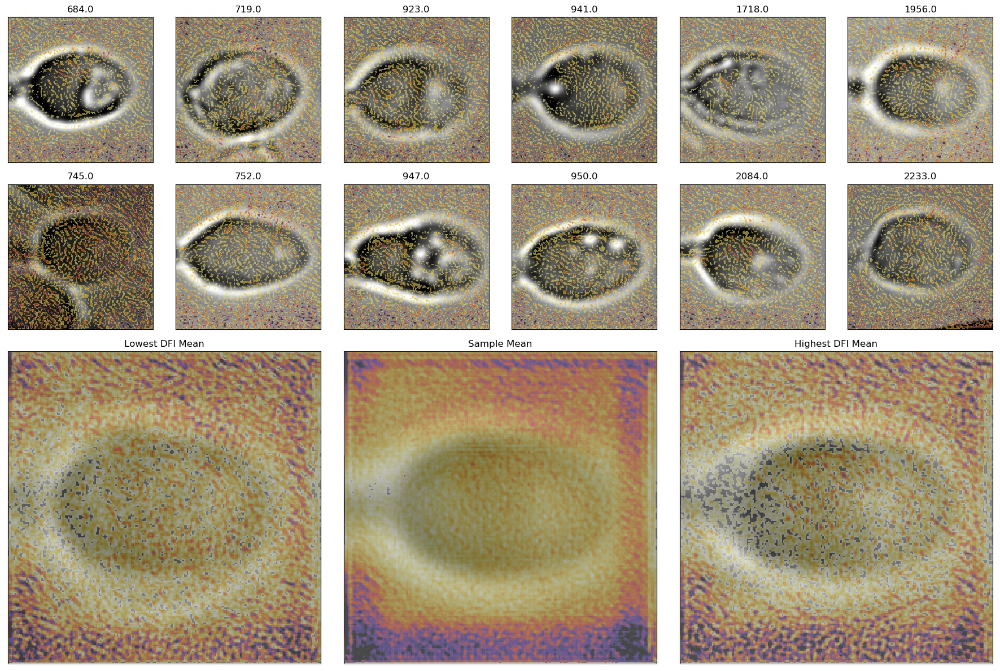

total time is 4.42 minutes
D:\CNN_testing\data\set2\train\class0
D:\CNN_testing\data\set2\train/ num 1 of 1
saved model name = D:_CNN_testing_data_set2_saved_model.keras
Found 731 images belonging to 1 classes.


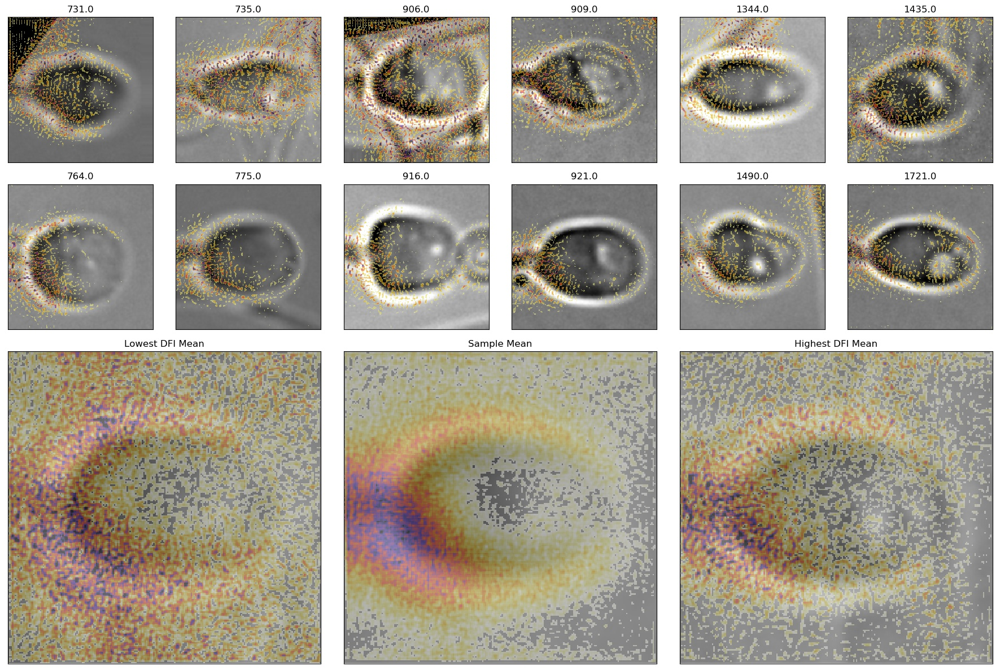

total time is 4.50 minutes
D:\CNN_testing\data\set3\train\class0
D:\CNN_testing\data\set3\train/ num 1 of 1
saved model name = D:_CNN_testing_data_set3_saved_model.keras
Found 762 images belonging to 1 classes.


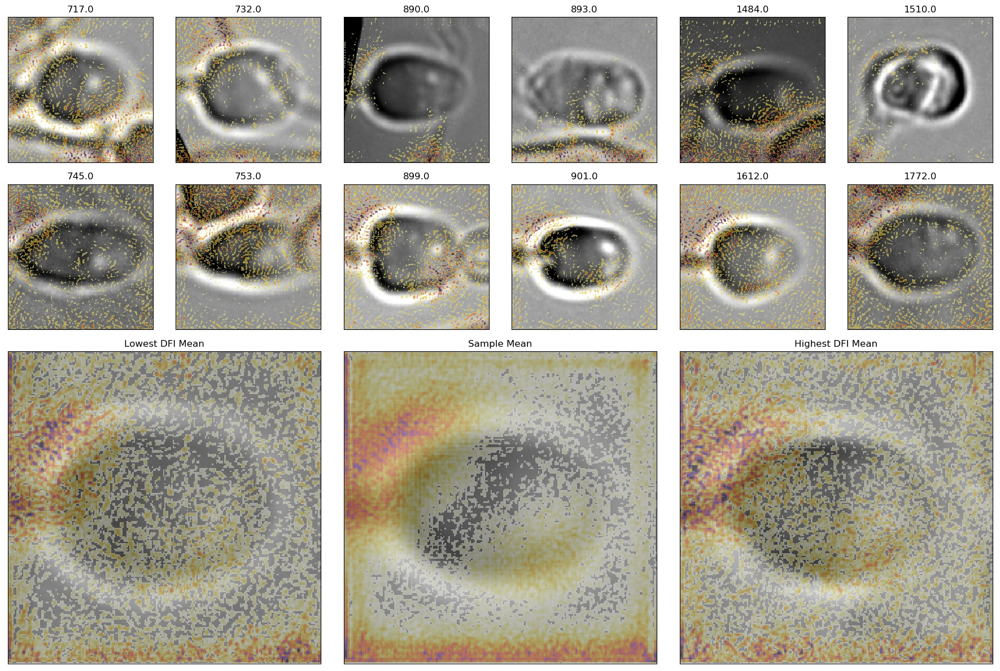

total time is 4.15 minutes
D:\CNN_testing\data\set4\train\class0
D:\CNN_testing\data\set4\train/ num 1 of 1
saved model name = D:_CNN_testing_data_set4_saved_model.keras
Found 780 images belonging to 1 classes.


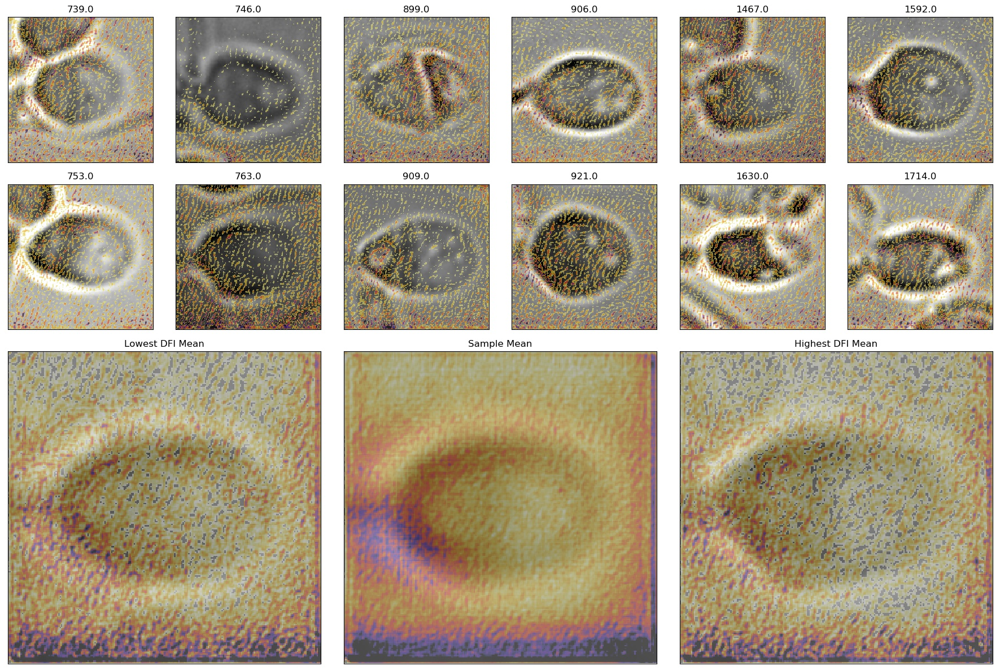

total time is 4.18 minutes
D:\CNN_testing\data\set5\train\class0
D:\CNN_testing\data\set5\train/ num 1 of 1
saved model name = D:_CNN_testing_data_set5_saved_model.keras
Found 792 images belonging to 1 classes.


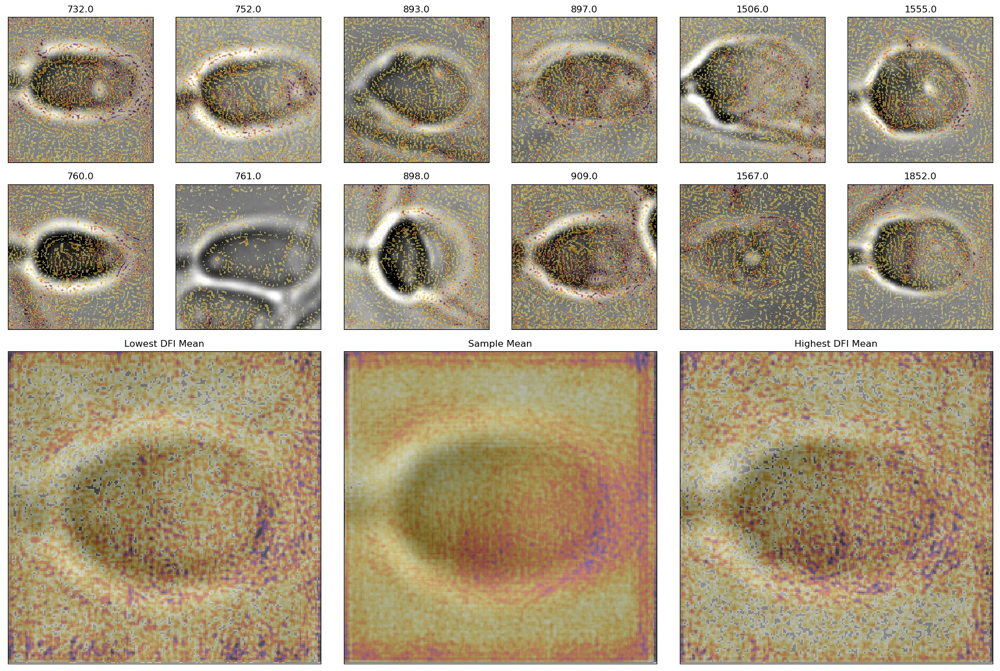

total time is 4.23 minutes
D:\CNN_testing\data\set6\train\class0
D:\CNN_testing\data\set6\train/ num 1 of 1
saved model name = D:_CNN_testing_data_set6_saved_model.keras
Found 744 images belonging to 1 classes.


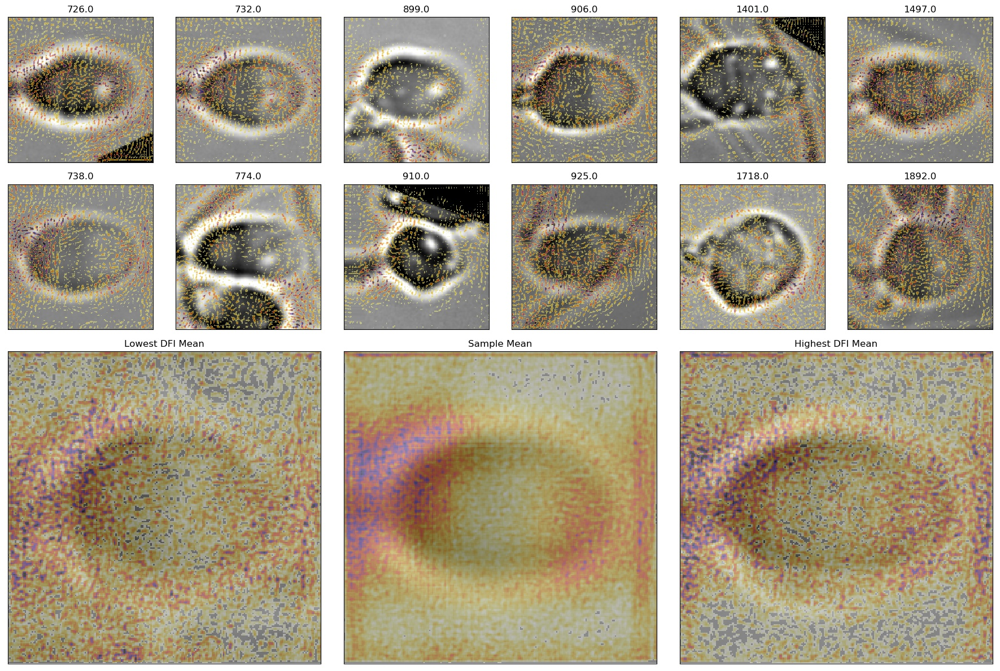

total time is 4.19 minutes
D:\CNN_testing\data\set7\train\class0
D:\CNN_testing\data\set7\train/ num 1 of 1
saved model name = D:_CNN_testing_data_set7_saved_model.keras
Found 638 images belonging to 1 classes.


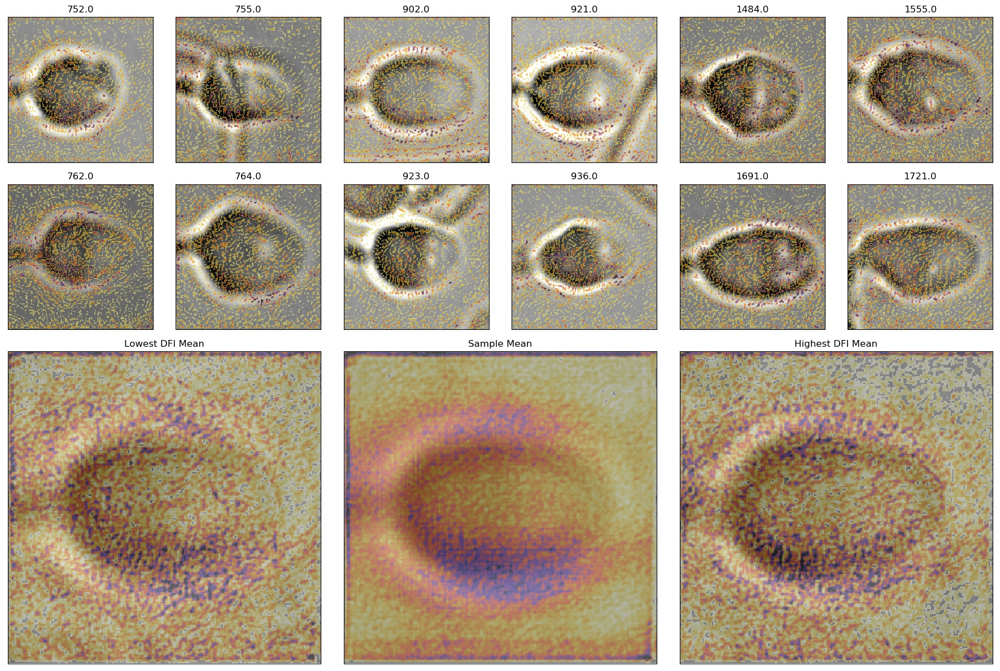

total time is 4.17 minutes


In [30]:
K.clear_session()

# how to up/downscale images to VGG16 224x224, 'bilinear' works well
interpolation = 'bilinear' 

# run for each Set, letter folder in /data/
for i,data_dir in enumerate(allDirs):

    # set training data
    sub_data_dir = os.path.join(data_dir, 'train', 'class0')
    print(sub_data_dir)
    label_file = os.path.join(sub_data_dir, 'labels_train.csv')
    df = pd.read_csv(label_file)
    labels = np.asarray(df)[:,1].tolist()

    # grab output file names
    saved_model = saved_models[i]
    log_file = log_files[i]
    predictions_out = predictions_outs[i]

    ii=0
    tic = time.time()

    # create data generator for validation that only rescales
    datagen_test = ImageDataGenerator(
        rescale=1./255,
        preprocessing_function = None) # None

    # if we want something besides VGG16, then we need to know image sizes
    if VGG:
        img_shape = (224, 224)
    else:
        img_shape = find_img_shape(data_dir)

    # dimensions of images.
    img_width, img_height = img_shape[0], img_shape[1]

    # set train and test directories
    # this assumes you have already put images in these folders
    train_dir = os.path.join(data_dir, 'train/')

    # output where we are looking to check progress
    print(train_dir + ' num ' + str(ii+1) + ' of ' + str(n_times))

    # necessary in case images are of different format
    if K.image_data_format() == 'channels_first':
        input_shape = (3, img_width, img_height)
    else:
        input_shape = (img_width, img_height, 3)

    new_labels = np.round(np.asarray(labels) * mult_DFI)

    ## -------- save model ------------ ##
    print('saved model name = %s' % saved_model)
    model_new = load_model(saved_model)


    # how many images to load so we don't crash computer
    batch_size = 128
    
    ## create full training generator (non-shuffle) to post-analyze
    generator_train_post2 = datagen_test.flow_from_directory(
        train_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        shuffle=True,
        interpolation = interpolation,
        class_mode='binary')
    
    generator_train_post2.classes = new_labels
    
    ## -------- saliency maps  ------------ ##
    ## create Saliency maps for 5 images
    saliency_visualization_avg(generator_train_post2, 
                               sample_size=int(np.ceil(batch_size/10)), 
                               set=(i+1))
    
    toc = (time.time() - tic) / 60
    print('total time is %.2f minutes' % toc)
        
    del model_new
    # clear keras/tf session and collect trash
    K.clear_session()
    for ii in range(20): gc.collect()
                